**Table of contents**<a id='toc0_'></a>    
- [Instructions](#toc1_)    
- [Loading data](#toc2_)    
- [Importing datasets](#toc3_)    
- [Data Wrangling](#toc4_)    
- [iGraph](#toc5_)    
- [Degree distribution](#toc6_)    
    - [Other interesting measurements in main graphs and subgraphs before moving forward with remaining questions](#toc6_1_1_)    
- [Network Diameter and Average Path Length](#toc7_)    
- [Node importance: Centrality measures](#toc8_)    
- [Export Section](#toc9_)    

<!-- vscode-jupyter-toc-config
	numbering=false
	anchor=true
	flat=false
	minLevel=1
	maxLevel=6
	/vscode-jupyter-toc-config -->
<!-- THIS CELL WILL BE REPLACED ON TOC UPDATE. DO NOT WRITE YOUR TEXT IN THIS CELL -->

# <a id='toc1_'></a>[Instructions](#toc0_)
On this first assignment, applying the basic functions of the Igraph package is required. The following datasets are going to be used:

* Actors dataset - undirected graph - : For the 2005 Graph Drawing conference a data set was provided of the IMDB movie database. We will use a reduced version of this dataset, which derived all actor-actor collaboration edges where the actors co-starred in at least 2 movies together between 1995 and 2004. 


You have to complete the code chunks in this document but also analyze the results, extract insights and answer the short questions. Fill the CSV attached with your answers, sometimes just the number is enough, some others just a small sentence or paragraph. Remember to change the header with your email.

In your submission please upload both this document in HTML and the CSV with the solutions.




# <a id='toc2_'></a>[Loading data](#toc0_)

In this section, the goal is loading the datasets given, building the graph and analyzing basics metrics. Include the edge or node attributes you consider.

Describe the values provided by summary function on the graph object.



In [1]:
#!pip install networkx
#!pip install pandas 
#!pip install numpy
#!pip install matplotlib

In [2]:
import pandas as pd
import numpy as np
from igraph import *
import matplotlib.pyplot as plt
import cairocffi as cairo

# <a id='toc3_'></a>[Importing datasets](#toc0_)

In [3]:
#import csv for edges using pandas
df_edges = pd.read_csv('imdb_actor_edges_sol.csv', sep=';')

In [4]:
#show head of df_edges
df_edges.head()

,from,to,weight
0,n17776,n17778,6
1,n5578,n9770,3
2,n5578,n929,2
3,n5578,n9982,2
4,n1835,n6278,2


In [5]:
#change column from to source and column to to target
df_edges = df_edges.rename(columns={'from': 'source', 'to': 'target'})

In [6]:
df_edges.dtypes

source    object
target    object
weight     int64
dtype: object

In [7]:
#import csv for key using pandas
df_key = pd.read_csv('imdb_actors_key_sol.csv', sep=';')

In [8]:
df_key.head()

,id,ActorName,movies_95_04,main_genre,genres
0,n15629,"Rudder, Michael (I)",12,Thriller,"Action:1,Comedy:1,Drama:1,Fantasy:1,Horror:1,N..."
1,n5026,"Morgan, Debbi",16,Drama,"Comedy:2,Documentary:1,Drama:6,Horror:2,NULL:3..."
2,n11252,"Bellows, Gil",33,Drama,"Comedy:6,Documentary:1,Drama:7,Family:1,Fantas..."
3,n5150,"Dray, Albert",20,Comedy,"Comedy:6,Crime:1,Documentary:1,Drama:4,NULL:5,..."
4,n4057,"Daly, Shane (I)",18,Drama,"Comedy:2,Crime:1,Drama:7,Horror:1,Music:1,Musi..."


**1) How many nodes are there?**



In [9]:
print("There are", len(df_key), "nodes in the graph")

There are 17577 nodes in the graph


**2) How many edges are there?**

In [10]:
#print number of edges in the graph from df_edges
print("There are", len(df_edges), "edges in the graph")

There are 287074 edges in the graph


# <a id='toc4_'></a>[Data Wrangling](#toc0_)


- We want to get the genres as individual columns and have the number of movies done by each actor as a row. 

- This might be helpul to analyse later on in the exercise

In [11]:
# Split the 'genres' column by ',' to create separate columns for each genre
genres_df = df_key['genres'].str.split(',', expand=True)
genres_keys = set(genres_df.apply(lambda x: x.str.split(':', expand=True)[0]).values.flatten())
genres_keys.remove(None)
genres_keys.remove('NULL')
print(genres_keys)

df_with_genres = df_key.copy().drop('genres', axis=1)

def get_genre_count(x, genre):
    genre_counts = x.split(',')
    for genre_count in genre_counts:
        if genre_count.split(':')[0] == genre:
            return genre_count.split(':')[1]
    return 0

for genre in genres_keys:
    df_with_genres[genre] = df_key['genres'].apply(lambda x: get_genre_count(x, genre))

df_with_genres.head()

{'Music', 'Comedy', 'Action', 'Adult', 'Western', 'Horror', 'Adventure', 'Fantasy', 'Mystery', 'Crime', 'War', 'Sci-Fi', 'Short', 'Musical', 'Animation', 'Romance', 'Drama', 'Thriller', 'Documentary', 'Family'}


,id,ActorName,movies_95_04,main_genre,Music,Comedy,Action,Adult,Western,Horror,...,War,Sci-Fi,Short,Musical,Animation,Romance,Drama,Thriller,Documentary,Family
0,n15629,"Rudder, Michael (I)",12,Thriller,0,1,1,0,0,1,...,1,1,0,0,0,1,1,2,0,0
1,n5026,"Morgan, Debbi",16,Drama,0,2,0,0,0,2,...,0,0,0,0,0,2,6,0,1,0
2,n11252,"Bellows, Gil",33,Drama,0,6,0,0,0,1,...,0,0,2,0,0,6,7,4,1,1
3,n5150,"Dray, Albert",20,Comedy,0,6,0,0,0,0,...,0,0,1,0,0,1,4,1,1,0
4,n4057,"Daly, Shane (I)",18,Drama,1,2,0,0,0,1,...,0,0,0,1,0,1,7,4,0,0


In [12]:
#rename df_with_genres to df_nodes
df_nodes = df_with_genres

In [13]:
del df_with_genres

In [14]:
#show nulls in df_nodes
df_nodes.isnull().sum()

id               0
ActorName        0
movies_95_04     0
main_genre      68
Music            0
Comedy           0
Action           0
Adult            0
Western          0
Horror           0
Adventure        0
Fantasy          0
Mystery          0
Crime            0
War              0
Sci-Fi           0
Short            0
Musical          0
Animation        0
Romance          0
Drama            0
Thriller         0
Documentary      0
Family           0
dtype: int64

Not deleting nulls for now

# <a id='toc5_'></a>[iGraph](#toc0_)

In [15]:
#create the graph with igraph from our dataframes
g1 = Graph.DataFrame(edges=df_edges, vertices=df_nodes, directed=False, use_vids=False)

In [16]:
#color the edges and nodes according to the weight of the edge
g1.es['color'] = g1.es['weight']

In [17]:
#only plot if needed, otherwise check png saved in folder
#plot(g1, "g1-imdb.png")

- We get a png file as an output. 
- We can open this file outside of Visual Studio to further analyse the composition of the graph as renderizing it will significantly slow down the performance of our laptop.
- We build g1 as an undirected graph
    - We are plotting relations between actors co-starring in similar movies (weights)
    - Direction is reciprocal, hence it is not important



In [18]:
#show g1 info
g1.summary()


'IGRAPH UNW- 17577 287074 -- \n+ attr: Action (v), ActorName (v), Adult (v), Adventure (v), Animation (v), Comedy (v), Crime (v), Documentary (v), Drama (v), Family (v), Fantasy (v), Horror (v), Music (v), Musical (v), Mystery (v), Romance (v), Sci-Fi (v), Short (v), Thriller (v), War (v), Western (v), main_genre (v), movies_95_04 (v), name (v), color (e), weight (e)'

# <a id='toc6_'></a>[Degree distribution](#toc0_)

Analyse the degree distribution. Compute the total degree distribution.

**3) How does this distributions look like?**


- Our Graph is not connected as it shows relations within actors from IMDB.

- Not all actors necessarily must have a relationship among them, therefore having some isolated communities which make the resulting graph disconnected

- As a consequence of this, there is one massive body of connections and isolated satellites with little connections
      

In [19]:
#ignore depreciation warnings for now
import warnings
warnings.filterwarnings("ignore")


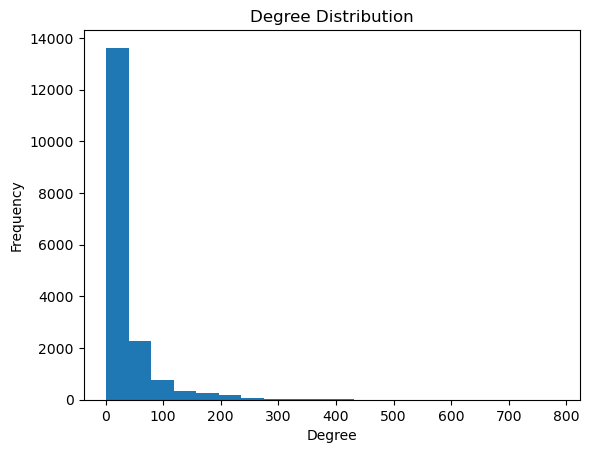

In [20]:
#plot histogram of degree distribution in g1 with 30 bins
plt.hist(g1.degree(), bins=20)
plt.title("Degree Distribution")
plt.xlabel("Degree")
plt.ylabel("Frequency")
plt.show()

- The degree of a graph is the number of edges that are connected to a given vertex.
- We can see most nodes have small connections

- The average degree is calculated by dividing the sum of the degrees of all vertices in the graph by the number of vertices in the graph.

In [21]:
#parse all degrees from g1 to a list and print the average degree of the graph
degrees = g1.degree()
print("The average degree of the main graph is", sum(degrees)/len(degrees))

The average degree of the main graph is 32.6647323206463


- This would be the average degree in the main graph implying the average number of connections in this network is 32

- Because the graph is not connected, we want to better understand how many subgraphs do we have

In [22]:
degree_weight = g1.strength(weights=g1.es['weight'])
print ("The average degree (weight) of the main graph is", sum(degree_weight)/len(degree_weight))

The average degree (weight) of the main graph is 107.17972350230414


In [23]:
#find the subgraphs of g1
subgraphs_weak = g1.components(mode="WEAK")
print ("There are", len(subgraphs_weak), "subgraphs in the main graph")
    
 

There are 19 subgraphs in the main graph


In [24]:
#average degree of g1
degrees_g1 = g1.degree()
print("The average degree of the main graph is", sum(degrees)/len(degrees))

The average degree of the main graph is 32.6647323206463


In [25]:
#adding degree to df_nodes
df_nodes['degree'] = degrees_g1
  
#show head of df_nodes
df_nodes.head()

,id,ActorName,movies_95_04,main_genre,Music,Comedy,Action,Adult,Western,Horror,...,Sci-Fi,Short,Musical,Animation,Romance,Drama,Thriller,Documentary,Family,degree
0,n15629,"Rudder, Michael (I)",12,Thriller,0,1,1,0,0,1,...,1,0,0,0,1,1,2,0,0,36
1,n5026,"Morgan, Debbi",16,Drama,0,2,0,0,0,2,...,0,0,0,0,2,6,0,1,0,23
2,n11252,"Bellows, Gil",33,Drama,0,6,0,0,0,1,...,0,2,0,0,6,7,4,1,1,22
3,n5150,"Dray, Albert",20,Comedy,0,6,0,0,0,0,...,0,1,0,0,1,4,1,1,0,23
4,n4057,"Daly, Shane (I)",18,Drama,1,2,0,0,0,1,...,0,0,1,0,1,7,4,0,0,46


In [26]:
#average degree weighted of g1
degree_weighted_g1 = g1.strength(weights=g1.es['weight'])

#aadding degree weighted to df_nodes
df_nodes['degree_weighted_g1'] = degree_weighted_g1
#show head of df_nodes
df_nodes.head()

,id,ActorName,movies_95_04,main_genre,Music,Comedy,Action,Adult,Western,Horror,...,Short,Musical,Animation,Romance,Drama,Thriller,Documentary,Family,degree,degree_weighted_g1
0,n15629,"Rudder, Michael (I)",12,Thriller,0,1,1,0,0,1,...,0,0,0,1,1,2,0,0,36,113.0
1,n5026,"Morgan, Debbi",16,Drama,0,2,0,0,0,2,...,0,0,0,2,6,0,1,0,23,47.0
2,n11252,"Bellows, Gil",33,Drama,0,6,0,0,0,1,...,2,0,0,6,7,4,1,1,22,48.0
3,n5150,"Dray, Albert",20,Comedy,0,6,0,0,0,0,...,1,0,0,1,4,1,1,0,23,57.0
4,n4057,"Daly, Shane (I)",18,Drama,1,2,0,0,0,1,...,0,1,0,1,7,4,0,0,46,108.0


In [27]:
#find average degree of the subgraphs 
for i in range(len(subgraphs_weak)): 
    print("The average degree of subgraph", i, "is", sum(subgraphs_weak.subgraph(i).degree())/len(subgraphs_weak.subgraph(i).degree()))

The average degree of subgraph 0 is 32.87436264680607
The average degree of subgraph 1 is 2.727272727272727
The average degree of subgraph 2 is 2.4347826086956523
The average degree of subgraph 3 is 3.0
The average degree of subgraph 4 is 3.3333333333333335
The average degree of subgraph 5 is 1.0
The average degree of subgraph 6 is 1.3333333333333333
The average degree of subgraph 7 is 4.909090909090909
The average degree of subgraph 8 is 1.0
The average degree of subgraph 9 is 2.0
The average degree of subgraph 10 is 1.0
The average degree of subgraph 11 is 1.0
The average degree of subgraph 12 is 1.0
The average degree of subgraph 13 is 1.0
The average degree of subgraph 14 is 1.3333333333333333
The average degree of subgraph 15 is 1.0
The average degree of subgraph 16 is 1.0
The average degree of subgraph 17 is 1.0
The average degree of subgraph 18 is 1.0


In [28]:
#find average degree strength of the subgraphs
for i in range(len(subgraphs_weak)):
    degree_weight = subgraphs_weak.subgraph(i).strength(weights=subgraphs_weak.subgraph(i).es['weight'])
    print ("The average degree (weight) of subgraph", i, "is", sum(degree_weight)/len(degree_weight))

The average degree (weight) of subgraph 0 is 107.86559725007162
The average degree (weight) of subgraph 1 is 6.090909090909091
The average degree (weight) of subgraph 2 is 5.304347826086956
The average degree (weight) of subgraph 3 is 40.5
The average degree (weight) of subgraph 4 is 7.212121212121212
The average degree (weight) of subgraph 5 is 2.0
The average degree (weight) of subgraph 6 is 4.0
The average degree (weight) of subgraph 7 is 24.90909090909091
The average degree (weight) of subgraph 8 is 11.0
The average degree (weight) of subgraph 9 is 13.333333333333334
The average degree (weight) of subgraph 10 is 2.0
The average degree (weight) of subgraph 11 is 5.0
The average degree (weight) of subgraph 12 is 4.0
The average degree (weight) of subgraph 13 is 10.0
The average degree (weight) of subgraph 14 is 7.333333333333333
The average degree (weight) of subgraph 15 is 2.0
The average degree (weight) of subgraph 16 is 2.0
The average degree (weight) of subgraph 17 is 2.0
The ave

- Subgraph 0 has a similar average degree than the main graph, we will see later it corresponds to the same graph
- The remaining subgraphs are very small so the average degree cannot be larger

In [29]:
#edges in g1
print("There are", len(g1.es), "edges in the main graph")

There are 287074 edges in the main graph


- Hence, subgraph 0 is almost as big as the main graph
- Subgraph0 is the main graph as it does not have any satellites (isolated subgraphs)
- We will use from now onwards graph0 for the analysis
    - Using g1 with the satellites can pose problems with certain measures such as closeness

In [30]:
#how many edges are in the subgraphs
for i in range(len(subgraphs_weak)):
    print("There are", len(subgraphs_weak.subgraph(i).es), "edges in subgraph", i)
     

There are 286911 edges in subgraph 0
There are 30 edges in subgraph 1
There are 28 edges in subgraph 2
There are 6 edges in subgraph 3
There are 55 edges in subgraph 4
There are 1 edges in subgraph 5
There are 2 edges in subgraph 6
There are 27 edges in subgraph 7
There are 1 edges in subgraph 8
There are 3 edges in subgraph 9
There are 1 edges in subgraph 10
There are 1 edges in subgraph 11
There are 1 edges in subgraph 12
There are 1 edges in subgraph 13
There are 2 edges in subgraph 14
There are 1 edges in subgraph 15
There are 1 edges in subgraph 16
There are 1 edges in subgraph 17
There are 1 edges in subgraph 18


- g1 and subgraph 0 have a small difference in total number of edges

In [31]:
#nodes in the subgraphs
for i in range(len(subgraphs_weak)):
    print("There are", len(subgraphs_weak.subgraph(i).vs), "nodes in subgraph", i)

There are 17455 nodes in subgraph 0
There are 22 nodes in subgraph 1
There are 23 nodes in subgraph 2
There are 4 nodes in subgraph 3
There are 33 nodes in subgraph 4
There are 2 nodes in subgraph 5
There are 3 nodes in subgraph 6
There are 11 nodes in subgraph 7
There are 2 nodes in subgraph 8
There are 3 nodes in subgraph 9
There are 2 nodes in subgraph 10
There are 2 nodes in subgraph 11
There are 2 nodes in subgraph 12
There are 2 nodes in subgraph 13
There are 3 nodes in subgraph 14
There are 2 nodes in subgraph 15
There are 2 nodes in subgraph 16
There are 2 nodes in subgraph 17
There are 2 nodes in subgraph 18


- There are 17577 nodes in g1, 122 more nodes than in subgraph 0
- This is due to the fact that subgraph0 does not have satellites (isolated subgraphs)
- These nodes are likely to be within the remaining subgraphs forming isolated graphs on their own

In [32]:
#store subgraph 0 as g0 
g0 = subgraphs_weak.subgraph(0)


In [33]:
g0.summary()

'IGRAPH UNW- 17455 286911 -- \n+ attr: Action (v), ActorName (v), Adult (v), Adventure (v), Animation (v), Comedy (v), Crime (v), Documentary (v), Drama (v), Family (v), Fantasy (v), Horror (v), Music (v), Musical (v), Mystery (v), Romance (v), Sci-Fi (v), Short (v), Thriller (v), War (v), Western (v), main_genre (v), movies_95_04 (v), name (v), color (e), weight (e)'

In [34]:
#calculate the average degree weghted of g0
degree_weighted_g0 = g0.strength(weights=g0.es['weight'])

print ("The average degree (weight) of subgraph 0 is", sum(degree_weighted_g0)/len(degree_weighted_g0)) 

#create a df_nodes_g0 with the nodes of g0 and the degree weighted of g0
df_nodes_g0 = pd.DataFrame(g0.vs['name'], columns=['name'])
df_nodes_g0['degree_weighted_g0'] = degree_weighted_g0
 
#show head of df_nodes_g0
df_nodes_g0.head()
 
 

The average degree (weight) of subgraph 0 is 107.86559725007162


,name,degree_weighted_g0
0,n15629,113.0
1,n5026,47.0
2,n11252,48.0
3,n5150,57.0
4,n4057,108.0


In [35]:
#calculate the average degree of g0
degree_g0 = g0.degree()
print("The average degree of subgraph 0 is", sum(degrees)/len(degrees))

#adding degree to df_nodes_g0
df_nodes_g0['degree_g0'] = degree_g0

The average degree of subgraph 0 is 32.6647323206463


In [36]:
df_nodes.columns


Index(['id', 'ActorName', 'movies_95_04', 'main_genre', 'Music', 'Comedy',
       'Action', 'Adult', 'Western', 'Horror', 'Adventure', 'Fantasy',
       'Mystery', 'Crime', 'War', 'Sci-Fi', 'Short', 'Musical', 'Animation',
       'Romance', 'Drama', 'Thriller', 'Documentary', 'Family', 'degree',
       'degree_weighted_g1'],
      dtype='object')

In [37]:
#add columns from df_nodes for 'ActorName', 'movies_95_04', 'main_genre', 'Short', 'Action','Crime', 'Mystery', 'Documentary', 'Horror', 'Sci-Fi', 'Comedy','Animation', 'Family', 'Fantasy', 'Thriller', 'Western', 'Adult','Romance', 'Adventure', 'War', 'Drama', 'Musical', 'Music' to df_nodes_g0
df_nodes_g0['ActorName'] = df_nodes['ActorName']
df_nodes_g0['movies_95_04'] = df_nodes['movies_95_04']
df_nodes_g0['main_genre'] = df_nodes['main_genre']
df_nodes_g0['Short'] = df_nodes['Short']
df_nodes_g0['Action'] = df_nodes['Action']
df_nodes_g0['Crime'] = df_nodes['Crime']
df_nodes_g0['Mystery'] = df_nodes['Mystery']
df_nodes_g0['Documentary'] = df_nodes['Documentary']
df_nodes_g0['Horror'] = df_nodes['Horror']
df_nodes_g0['Sci-Fi'] = df_nodes['Sci-Fi']
df_nodes_g0['Comedy'] = df_nodes['Comedy']
df_nodes_g0['Animation'] = df_nodes['Animation']
df_nodes_g0['Family'] = df_nodes['Family']
df_nodes_g0['Fantasy'] = df_nodes['Fantasy']
df_nodes_g0['Thriller'] = df_nodes['Thriller']
df_nodes_g0['Western'] = df_nodes['Western']
df_nodes_g0['Adult'] = df_nodes['Adult']
df_nodes_g0['Romance'] = df_nodes['Romance']
df_nodes_g0['Adventure'] = df_nodes['Adventure']
df_nodes_g0['War'] = df_nodes['War']
df_nodes_g0['Drama'] = df_nodes['Drama']
df_nodes_g0['Musical'] = df_nodes['Musical']
df_nodes_g0['Music'] = df_nodes['Music']
 
#show head of df_nodes_g0
df_nodes_g0.head()
 

,name,degree_weighted_g0,degree_g0,ActorName,movies_95_04,main_genre,Short,Action,Crime,Mystery,...,Fantasy,Thriller,Western,Adult,Romance,Adventure,War,Drama,Musical,Music
0,n15629,113.0,36,"Rudder, Michael (I)",12,Thriller,0,1,0,0,...,1,2,0,0,1,0,1,1,0,0
1,n5026,47.0,23,"Morgan, Debbi",16,Drama,0,0,0,0,...,0,0,0,0,2,0,0,6,0,0
2,n11252,48.0,22,"Bellows, Gil",33,Drama,2,0,0,2,...,1,4,0,0,6,0,0,7,0,0
3,n5150,57.0,23,"Dray, Albert",20,Comedy,1,0,1,0,...,0,1,0,0,1,0,0,4,0,0
4,n4057,108.0,46,"Daly, Shane (I)",18,Drama,0,0,1,0,...,0,4,0,0,1,0,0,7,1,1


### <a id='toc6_1_1_'></a>[Other interesting measurements in main graphs and subgraphs before moving forward with remaining questions](#toc0_)

In [38]:
#density of g1
density = g0.density()

print("The density of the main graph is", density)


The density of the main graph is 0.0018834858855738552


In [39]:
#add density to df_nodes
df_nodes['density'] = density

#show density in df_nodes sorted from highest to lowest
df_nodes.sort_values(by=['density'], ascending=True).head()

,id,ActorName,movies_95_04,main_genre,Music,Comedy,Action,Adult,Western,Horror,...,Musical,Animation,Romance,Drama,Thriller,Documentary,Family,degree,degree_weighted_g1,density
0,n15629,"Rudder, Michael (I)",12,Thriller,0,1,1,0,0,1,...,0,0,1,1,2,0,0,36,113.0,0.001883
11707,n6164,"Cintra, Luís Miguel",19,Drama,0,2,0,0,0,0,...,0,0,0,13,0,0,0,13,40.0,0.001883
11708,n1355,"Yanada, Kiyoyuki",21,Sci-Fi,0,3,1,0,1,1,...,0,4,0,0,0,0,2,73,169.0,0.001883
11709,n3388,"Tarantina, Brian",12,Drama,0,2,0,0,0,0,...,0,0,1,4,2,0,0,9,18.0,0.001883
11710,n750,"Macdonald, Norm",17,Comedy,1,11,0,0,0,0,...,0,0,0,0,0,0,1,92,274.0,0.001883


In [40]:
#density of subgraphs 
for i in range(len(subgraphs_weak)):
    print("The density of subgraph", i, "is", subgraphs_weak.subgraph(i).density())

The density of subgraph 0 is 0.0018834858855738552
The density of subgraph 1 is 0.12987012987012986
The density of subgraph 2 is 0.1106719367588933
The density of subgraph 3 is 1.0
The density of subgraph 4 is 0.10416666666666667
The density of subgraph 5 is 1.0
The density of subgraph 6 is 0.6666666666666666
The density of subgraph 7 is 0.4909090909090909
The density of subgraph 8 is 1.0
The density of subgraph 9 is 1.0
The density of subgraph 10 is 1.0
The density of subgraph 11 is 1.0
The density of subgraph 12 is 1.0
The density of subgraph 13 is 1.0
The density of subgraph 14 is 0.6666666666666666
The density of subgraph 15 is 1.0
The density of subgraph 16 is 1.0
The density of subgraph 17 is 1.0
The density of subgraph 18 is 1.0


In [41]:
#average number of triangles in g1
avg_triangles_undirected  = g1.transitivity_avglocal_undirected()
print("The average number of triangles (clustering coefficient) in the main graph is", g1.transitivity_avglocal_undirected())

The average number of triangles (clustering coefficient) in the main graph is 0.3484735397961945


In [42]:
#add avg_triangles to df_nodes
df_nodes['avg_triangles'] = avg_triangles_undirected

#head of df_nodes
df_nodes.head()


,id,ActorName,movies_95_04,main_genre,Music,Comedy,Action,Adult,Western,Horror,...,Animation,Romance,Drama,Thriller,Documentary,Family,degree,degree_weighted_g1,density,avg_triangles
0,n15629,"Rudder, Michael (I)",12,Thriller,0,1,1,0,0,1,...,0,1,1,2,0,0,36,113.0,0.001883,0.348474
1,n5026,"Morgan, Debbi",16,Drama,0,2,0,0,0,2,...,0,2,6,0,1,0,23,47.0,0.001883,0.348474
2,n11252,"Bellows, Gil",33,Drama,0,6,0,0,0,1,...,0,6,7,4,1,1,22,48.0,0.001883,0.348474
3,n5150,"Dray, Albert",20,Comedy,0,6,0,0,0,0,...,0,1,4,1,1,0,23,57.0,0.001883,0.348474
4,n4057,"Daly, Shane (I)",18,Drama,1,2,0,0,0,1,...,0,1,7,4,0,0,46,108.0,0.001883,0.348474


In [43]:
#average number of triangles in subgraphs
for i in range(len(subgraphs_weak)):
    print("The average number of triangles (clustering coefficient) in subgraph", i, "is", subgraphs_weak.subgraph(i).transitivity_avglocal_undirected())


The average number of triangles (clustering coefficient) in subgraph 0 is 0.34838528324810225
The average number of triangles (clustering coefficient) in subgraph 1 is 0.32539682539682535
The average number of triangles (clustering coefficient) in subgraph 2 is 0.07671957671957672
The average number of triangles (clustering coefficient) in subgraph 3 is 1.0
The average number of triangles (clustering coefficient) in subgraph 4 is 0.23690476190476195
The average number of triangles (clustering coefficient) in subgraph 5 is nan
The average number of triangles (clustering coefficient) in subgraph 6 is 0.0
The average number of triangles (clustering coefficient) in subgraph 7 is 0.893939393939394
The average number of triangles (clustering coefficient) in subgraph 8 is nan
The average number of triangles (clustering coefficient) in subgraph 9 is 1.0
The average number of triangles (clustering coefficient) in subgraph 10 is nan
The average number of triangles (clustering coefficient) in sub

- The maximum number of triangles measures the number of edges in the graph minus two. For example, if a graph has 10 edges, the maximum number of triangles it can contain is 8.

In [44]:
#maximum number of triangles in g1
print("The maximum number of triangles in the main graph is", g1.transitivity_undirected())

The maximum number of triangles in the main graph is 0.3666203673687031


In [45]:
#maximum number of triangles in subgraphs
for i in range(len(subgraphs_weak)):
    print("The maximum number of triangles in subgraph", i, "is", subgraphs_weak.subgraph(i).transitivity_undirected())
    

The maximum number of triangles in subgraph 0 is 0.36661961560666617
The maximum number of triangles in subgraph 1 is 0.2962962962962963
The maximum number of triangles in subgraph 2 is 0.04918032786885246
The maximum number of triangles in subgraph 3 is 1.0
The maximum number of triangles in subgraph 4 is 0.24725274725274726
The maximum number of triangles in subgraph 5 is nan
The maximum number of triangles in subgraph 6 is 0.0
The maximum number of triangles in subgraph 7 is 0.8869565217391304
The maximum number of triangles in subgraph 8 is nan
The maximum number of triangles in subgraph 9 is 1.0
The maximum number of triangles in subgraph 10 is nan
The maximum number of triangles in subgraph 11 is nan
The maximum number of triangles in subgraph 12 is nan
The maximum number of triangles in subgraph 13 is nan
The maximum number of triangles in subgraph 14 is 0.0
The maximum number of triangles in subgraph 15 is nan
The maximum number of triangles in subgraph 16 is nan
The maximum nu

In [46]:
#vertex id with maximum number of triangles in g1
print("The vertex id with the maximum number of triangles in the main graph is", g1.transitivity_local_undirected().index(max(g1.transitivity_local_undirected())))

#store the vertex id with maximum number of triangles in g1
max_triangles = g1.transitivity_local_undirected()

The vertex id with the maximum number of triangles in the main graph is 71


In [47]:
#add max_triangles to df_nodes
df_nodes['max_triangles'] = max_triangles
 
#head of df_nodes
df_nodes.head()

,id,ActorName,movies_95_04,main_genre,Music,Comedy,Action,Adult,Western,Horror,...,Romance,Drama,Thriller,Documentary,Family,degree,degree_weighted_g1,density,avg_triangles,max_triangles
0,n15629,"Rudder, Michael (I)",12,Thriller,0,1,1,0,0,1,...,1,1,2,0,0,36,113.0,0.001883,0.348474,0.523810
1,n5026,"Morgan, Debbi",16,Drama,0,2,0,0,0,2,...,2,6,0,1,0,23,47.0,0.001883,0.348474,0.462451
2,n11252,"Bellows, Gil",33,Drama,0,6,0,0,0,1,...,6,7,4,1,1,22,48.0,0.001883,0.348474,0.212121
3,n5150,"Dray, Albert",20,Comedy,0,6,0,0,0,0,...,1,4,1,1,0,23,57.0,0.001883,0.348474,0.217391
4,n4057,"Daly, Shane (I)",18,Drama,1,2,0,0,0,1,...,1,7,4,0,0,46,108.0,0.001883,0.348474,0.147826


In [48]:
#vertex id with maximum number of triangles in subgraphs
for i in range(len(subgraphs_weak)):
    print("The vertex id with the maximum number of triangles in subgraph", i, "is", subgraphs_weak.subgraph(i).transitivity_local_undirected().index(max(subgraphs_weak.subgraph(i).transitivity_local_undirected())))

The vertex id with the maximum number of triangles in subgraph 0 is 131
The vertex id with the maximum number of triangles in subgraph 1 is 0
The vertex id with the maximum number of triangles in subgraph 2 is 9
The vertex id with the maximum number of triangles in subgraph 3 is 0
The vertex id with the maximum number of triangles in subgraph 4 is 12


ValueError: nan is not in list

- Error is due to NaN

In [49]:
#ActorName with maximum number of triangles in subgraphs
for i in range(len(subgraphs_weak)):
    print("The actor with the maximum number of triangles in subgraph", i, "is", df_nodes.iloc[subgraphs_weak.subgraph(i).transitivity_local_undirected().index(max(subgraphs_weak.subgraph(i).transitivity_local_undirected()))]['ActorName'])
     
     

The actor with the maximum number of triangles in subgraph 0 is Wild, Rebecca
The actor with the maximum number of triangles in subgraph 1 is Rudder, Michael (I)
The actor with the maximum number of triangles in subgraph 2 is Champagne (II)
The actor with the maximum number of triangles in subgraph 3 is Rudder, Michael (I)
The actor with the maximum number of triangles in subgraph 4 is Welch, Raquel


ValueError: nan is not in list

The assortativity measures the degree to which nodes tend to connect to other nodes with similar properties.

In [50]:
#assortativity of g1
assortability_undirected = g1.assortativity_degree(directed=False)
print("The assortativity of the main graph is", g1.assortativity_degree(directed=False))

The assortativity of the main graph is 0.29341469917064045


In [51]:
#assortativity of subgraphs
for i in range(len(subgraphs_weak)):
    print("The assortativity of subgraph", i, "is", subgraphs_weak.subgraph(i).assortativity_degree(directed=False))
     


The assortativity of subgraph 0 is 0.29305462580433556
The assortativity of subgraph 1 is -0.07816711590296527
The assortativity of subgraph 2 is -0.2822545134302065
The assortativity of subgraph 3 is nan
The assortativity of subgraph 4 is 0.1029774322017813
The assortativity of subgraph 5 is nan
The assortativity of subgraph 6 is -1.0
The assortativity of subgraph 7 is 0.8341862845445241
The assortativity of subgraph 8 is nan
The assortativity of subgraph 9 is nan
The assortativity of subgraph 10 is nan
The assortativity of subgraph 11 is nan
The assortativity of subgraph 12 is nan
The assortativity of subgraph 13 is nan
The assortativity of subgraph 14 is -1.0
The assortativity of subgraph 15 is nan
The assortativity of subgraph 16 is nan
The assortativity of subgraph 17 is nan
The assortativity of subgraph 18 is nan


In [52]:
#add assortability to df_nodes 
df_nodes['assortability_undirected'] = assortability_undirected
#head of df_nodes sorting by assortability
df_nodes.sort_values(by=['assortability_undirected'], ascending=True).head()

,id,ActorName,movies_95_04,main_genre,Music,Comedy,Action,Adult,Western,Horror,...,Drama,Thriller,Documentary,Family,degree,degree_weighted_g1,density,avg_triangles,max_triangles,assortability_undirected
0,n15629,"Rudder, Michael (I)",12,Thriller,0,1,1,0,0,1,...,1,2,0,0,36,113.0,0.001883,0.348474,0.523810,0.293415
11707,n6164,"Cintra, Luís Miguel",19,Drama,0,2,0,0,0,0,...,13,0,0,0,13,40.0,0.001883,0.348474,0.243590,0.293415
11708,n1355,"Yanada, Kiyoyuki",21,Sci-Fi,0,3,1,0,1,1,...,0,0,0,2,73,169.0,0.001883,0.348474,0.298706,0.293415
11709,n3388,"Tarantina, Brian",12,Drama,0,2,0,0,0,0,...,4,2,0,0,9,18.0,0.001883,0.348474,0.138889,0.293415
11710,n750,"Macdonald, Norm",17,Comedy,1,11,0,0,0,0,...,0,0,0,1,92,274.0,0.001883,0.348474,0.605112,0.293415


- After running some measurements, let's put a face to the subgraphs
- Saving all 19 subgraphs to png, please check images individually

In [53]:
#create a list with outplot of the subgraphs
outplot = []
for i in range(len(subgraphs_weak)):
    outplot.append("subgraph" + str(i) + ".png")
    
#plot the subgraphs
for i in range(len(subgraphs_weak)):
    plot(subgraphs_weak.subgraph(i), outplot[i])
     
       

**Tidying the df**


In [54]:
#delete columns density, avg_triangles and assortability_undirected from df_nodes
del df_nodes['density']
del df_nodes['avg_triangles']
del df_nodes['assortability_undirected']
 
#head of df_nodes
df_nodes.head()

,id,ActorName,movies_95_04,main_genre,Music,Comedy,Action,Adult,Western,Horror,...,Musical,Animation,Romance,Drama,Thriller,Documentary,Family,degree,degree_weighted_g1,max_triangles
0,n15629,"Rudder, Michael (I)",12,Thriller,0,1,1,0,0,1,...,0,0,1,1,2,0,0,36,113.0,0.523810
1,n5026,"Morgan, Debbi",16,Drama,0,2,0,0,0,2,...,0,0,2,6,0,1,0,23,47.0,0.462451
2,n11252,"Bellows, Gil",33,Drama,0,6,0,0,0,1,...,0,0,6,7,4,1,1,22,48.0,0.212121
3,n5150,"Dray, Albert",20,Comedy,0,6,0,0,0,0,...,0,0,1,4,1,1,0,23,57.0,0.217391
4,n4057,"Daly, Shane (I)",18,Drama,1,2,0,0,0,1,...,1,0,1,7,4,0,0,46,108.0,0.147826


In [55]:
#adding columns from df_nodes "max_triangles" to df_nodes_g0
df_nodes_g0['max_triangles'] = df_nodes['max_triangles']

#head of df_nodes_g0
df_nodes_g0.head()

,name,degree_weighted_g0,degree_g0,ActorName,movies_95_04,main_genre,Short,Action,Crime,Mystery,...,Thriller,Western,Adult,Romance,Adventure,War,Drama,Musical,Music,max_triangles
0,n15629,113.0,36,"Rudder, Michael (I)",12,Thriller,0,1,0,0,...,2,0,0,1,0,1,1,0,0,0.523810
1,n5026,47.0,23,"Morgan, Debbi",16,Drama,0,0,0,0,...,0,0,0,2,0,0,6,0,0,0.462451
2,n11252,48.0,22,"Bellows, Gil",33,Drama,2,0,0,2,...,4,0,0,6,0,0,7,0,0,0.212121
3,n5150,57.0,23,"Dray, Albert",20,Comedy,1,0,1,0,...,1,0,0,1,0,0,4,0,0,0.217391
4,n4057,108.0,46,"Daly, Shane (I)",18,Drama,0,0,1,0,...,4,0,0,1,0,0,7,1,1,0.147826



**4) What is the maximum degree?**

- The degree of a graph is the number of edges that are connected to a given vertex.



In [56]:
print("The maximum degree of g1 is:", g1.maxdegree())

The maximum degree of g1 is: 784


In [57]:
#printing for the main graph without subgraphs
print("The maximum degree of g0 is:", g0.maxdegree())

The maximum degree of g0 is: 784


- We get the same maximum degree for both g0 and g1

- This could be seen in the earlier histogram for g1
- We plot now for g0 as well

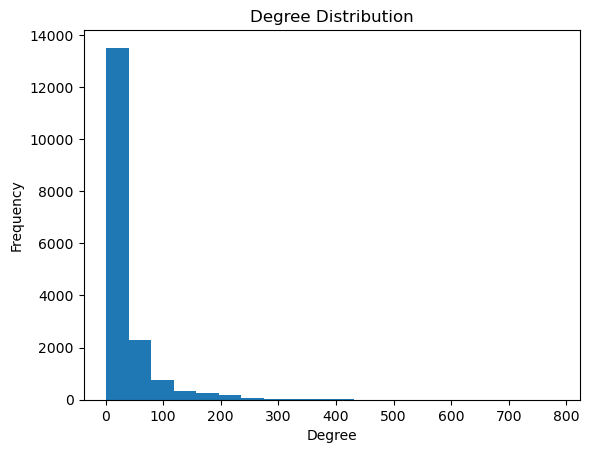

In [58]:
#plot histogram of degree distribution in g0 with 30 bins
plt.hist(g0.degree(), bins=20)
plt.title("Degree Distribution")
plt.xlabel("Degree")
plt.ylabel("Frequency")
plt.show()

In [59]:
#show the vertex id with the maximum degree
print("The vertex id with the maximum degree is:", g1.degree().index(max(g1.degree())))

#show ActorName of the vertex id with maximum degree
print("The ActorName with the maximum degree is:", g1.vs[g1.degree().index(max(g1.degree()))]['ActorName'])

The vertex id with the maximum degree is: 12147
The ActorName with the maximum degree is: Davis, Mark (V)


- Doing the same for g0, our main graph without subgraphs

In [60]:
#show the vertex id with the maximum degree
print("The vertex id with the maximum degree is:", g0.degree().index(max(g0.degree())))

#show ActorName of the vertex id with maximum degree
print("The ActorName with the maximum degree is:", g0.vs[g0.degree().index(max(g0.degree()))]['ActorName'])

The vertex id with the maximum degree is: 12069
The ActorName with the maximum degree is: Davis, Mark (V)


- We get the same Actor name from g1 and g0 with a different vertex id

In [61]:
#max degree of subgraphs
for i in range(len(subgraphs_weak)):
    print("The maximum degree of subgraph", i, "is:", subgraphs_weak.subgraph(i).maxdegree())
    

The maximum degree of subgraph 0 is: 784
The maximum degree of subgraph 1 is: 8
The maximum degree of subgraph 2 is: 7
The maximum degree of subgraph 3 is: 3
The maximum degree of subgraph 4 is: 8
The maximum degree of subgraph 5 is: 1
The maximum degree of subgraph 6 is: 2
The maximum degree of subgraph 7 is: 6
The maximum degree of subgraph 8 is: 1
The maximum degree of subgraph 9 is: 2
The maximum degree of subgraph 10 is: 1
The maximum degree of subgraph 11 is: 1
The maximum degree of subgraph 12 is: 1
The maximum degree of subgraph 13 is: 1
The maximum degree of subgraph 14 is: 2
The maximum degree of subgraph 15 is: 1
The maximum degree of subgraph 16 is: 1
The maximum degree of subgraph 17 is: 1
The maximum degree of subgraph 18 is: 1


In [62]:
#vertex id of the node with the maximum degree in subgraphs 
for i in range(len(subgraphs_weak)):
    print("The vertex id with the maximum degree in subgraph", i, "is:", subgraphs_weak.subgraph(i).degree().index(max(subgraphs_weak.subgraph(i).degree())))

The vertex id with the maximum degree in subgraph 0 is: 12069
The vertex id with the maximum degree in subgraph 1 is: 1
The vertex id with the maximum degree in subgraph 2 is: 22
The vertex id with the maximum degree in subgraph 3 is: 0
The vertex id with the maximum degree in subgraph 4 is: 28
The vertex id with the maximum degree in subgraph 5 is: 0
The vertex id with the maximum degree in subgraph 6 is: 0
The vertex id with the maximum degree in subgraph 7 is: 0
The vertex id with the maximum degree in subgraph 8 is: 0
The vertex id with the maximum degree in subgraph 9 is: 0
The vertex id with the maximum degree in subgraph 10 is: 0
The vertex id with the maximum degree in subgraph 11 is: 0
The vertex id with the maximum degree in subgraph 12 is: 0
The vertex id with the maximum degree in subgraph 13 is: 0
The vertex id with the maximum degree in subgraph 14 is: 1
The vertex id with the maximum degree in subgraph 15 is: 0
The vertex id with the maximum degree in subgraph 16 is: 0
T

In [63]:
#ActorName of the node with the maximum degree in subgraphs
for i in range(len(subgraphs_weak)):
    print("The ActorName with the maximum degree in subgraph", i, "is:", subgraphs_weak.subgraph(i).vs[subgraphs_weak.subgraph(i).degree().index(max(subgraphs_weak.subgraph(i).degree()))]['ActorName'])

The ActorName with the maximum degree in subgraph 0 is: Davis, Mark (V)
The ActorName with the maximum degree in subgraph 1 is: Klauzner, Uri
The ActorName with the maximum degree in subgraph 2 is: Lee, Beom-su
The ActorName with the maximum degree in subgraph 3 is: Vischer, Lisa
The ActorName with the maximum degree in subgraph 4 is: Kotanidis, Yorgos
The ActorName with the maximum degree in subgraph 5 is: Shakibai, Khosro
The ActorName with the maximum degree in subgraph 6 is: Nor, Rosyam
The ActorName with the maximum degree in subgraph 7 is: Armanis, Julian
The ActorName with the maximum degree in subgraph 8 is: Holt, David (III)
The ActorName with the maximum degree in subgraph 9 is: Black, Rick (II)
The ActorName with the maximum degree in subgraph 10 is: Fox, Emilia
The ActorName with the maximum degree in subgraph 11 is: Matsushita, Yuki
The ActorName with the maximum degree in subgraph 12 is: Stover, George
The ActorName with the maximum degree in subgraph 13 is: Lähde, Ville 

- These are the actors with most number of connections for the remaining subgraphs
- As stated earlier, we will focus onwards only in g0, the main graph without any subgraphs

**5) What is the minimum degree?**
- The degree of a graph is the number of edges that are connected to a given vertex.


In [64]:
print("The minimum degree of g1 is:", min(g1.degree()))


The minimum degree of g1 is: 1


In [65]:
#print the vertex id with the minimum degree
print("The vertex id with the minimum degree is:", g1.degree().index(min(g1.degree())))

#print ActorName of the vertex id with minimum degree
print("The ActorName with the minimum degree is:", g1.vs[g1.degree().index(min(g1.degree()))]['ActorName'])
 

The vertex id with the minimum degree is: 20
The ActorName with the minimum degree is: Sokoloff, Marla


- There are many actors with minimum degree

In [66]:
#show top 10 nodes with degree_g0 == 1 from df_nodes_g0
df_nodes_g0[df_nodes_g0['degree_g0'] == 1].sort_values(by=['degree_g0'], ascending=False).head(10)

,name,degree_weighted_g0,degree_g0,ActorName,movies_95_04,main_genre,Short,Action,Crime,Mystery,...,Thriller,Western,Adult,Romance,Adventure,War,Drama,Musical,Music,max_triangles
20,n9764,2.0,1,"Sokoloff, Marla",11,Comedy,1,0,1,0,...,0,0,0,1,0,0,2,0,0,NaN
11211,n16916,2.0,1,"Laupichler, Rainer",12,Crime,0,0,6,0,...,3,0,0,0,0,0,1,0,0,0.500000
11573,n4041,2.0,1,"Platas, Gabriela",14,Romance,0,0,0,0,...,0,0,0,5,0,0,1,1,0,0.308458
11552,n13317,2.0,1,"Wilson, Stuart (II)",13,Romance,0,0,0,2,...,1,1,0,3,0,0,2,0,0,0.166667
11492,n17613,2.0,1,"Spybey, Dina",14,Drama,0,0,1,0,...,1,0,0,3,0,0,5,0,1,0.250000
11452,n10084,2.0,1,"Seth, Joshua",27,Sci-Fi,0,3,0,0,...,1,0,0,2,1,0,1,0,0,0.592381
11426,n7103,2.0,1,"Jeanne, Lucie",13,Drama,2,0,1,0,...,0,0,0,2,0,0,2,0,0,0.000000
11363,n17411,2.0,1,"Ng, Richard",12,Romance,1,0,1,0,...,0,0,0,3,1,0,2,0,0,0.761905
11348,n14858,2.0,1,"Sakakibara, Yoshiko",13,Animation,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0.400810
11330,n583,2.0,1,"Bron, Eleanor",10,Drama,0,0,0,1,...,0,0,0,2,0,0,2,0,0,NaN


In [67]:
#how many actors with degree_g0 == 1 in df_nodes_g0
print("There are", len(df_nodes_g0[df_nodes_g0['degree_g0'] == 1]), "actors with degree_g0 == 1")
#how many actors with degree_weighted_g0 == 2 in df_nodes_g0
print("There are", len(df_nodes_g0[df_nodes_g0['degree_weighted_g0'] == 2]), "actors with degree_weighted_g0 == 2")


There are 434 actors with degree_g0 == 1
There are 398 actors with degree_weighted_g0 == 2


In [68]:
#min degree of subgraphs
for i in range(len(subgraphs_weak)):
    print("The minimum degree of subgraph", i, "is:", min(subgraphs_weak.subgraph(i).degree()))
    

The minimum degree of subgraph 0 is: 1
The minimum degree of subgraph 1 is: 1
The minimum degree of subgraph 2 is: 1
The minimum degree of subgraph 3 is: 3
The minimum degree of subgraph 4 is: 1
The minimum degree of subgraph 5 is: 1
The minimum degree of subgraph 6 is: 1
The minimum degree of subgraph 7 is: 3
The minimum degree of subgraph 8 is: 1
The minimum degree of subgraph 9 is: 2
The minimum degree of subgraph 10 is: 1
The minimum degree of subgraph 11 is: 1
The minimum degree of subgraph 12 is: 1
The minimum degree of subgraph 13 is: 1
The minimum degree of subgraph 14 is: 1
The minimum degree of subgraph 15 is: 1
The minimum degree of subgraph 16 is: 1
The minimum degree of subgraph 17 is: 1
The minimum degree of subgraph 18 is: 1


- Looks like subgraphs 3, 7 and 9 have a higher minimum degree showing higher connectivity due to smaller size


In [69]:
#vertex id of the node with the minimum degree in subgraphs
for i in range(len(subgraphs_weak)):
    print("The vertex id with the minimum degree in subgraph", i, "is:", subgraphs_weak.subgraph(i).degree().index(min(subgraphs_weak.subgraph(i).degree())))


The vertex id with the minimum degree in subgraph 0 is: 20
The vertex id with the minimum degree in subgraph 1 is: 4
The vertex id with the minimum degree in subgraph 2 is: 8
The vertex id with the minimum degree in subgraph 3 is: 0
The vertex id with the minimum degree in subgraph 4 is: 6
The vertex id with the minimum degree in subgraph 5 is: 0
The vertex id with the minimum degree in subgraph 6 is: 1
The vertex id with the minimum degree in subgraph 7 is: 8
The vertex id with the minimum degree in subgraph 8 is: 0
The vertex id with the minimum degree in subgraph 9 is: 0
The vertex id with the minimum degree in subgraph 10 is: 0
The vertex id with the minimum degree in subgraph 11 is: 0
The vertex id with the minimum degree in subgraph 12 is: 0
The vertex id with the minimum degree in subgraph 13 is: 0
The vertex id with the minimum degree in subgraph 14 is: 0
The vertex id with the minimum degree in subgraph 15 is: 0
The vertex id with the minimum degree in subgraph 16 is: 0
The ve

In [70]:
#ActorName of the node with the minimum degree in subgraphs
for i in range(len(subgraphs_weak)):
    print("The ActorName with the minimum degree in subgraph", i, "is:", subgraphs_weak.subgraph(i).vs[subgraphs_weak.subgraph(i).degree().index(min(subgraphs_weak.subgraph(i).degree()))]['ActorName'])

The ActorName with the minimum degree in subgraph 0 is: Sokoloff, Marla
The ActorName with the minimum degree in subgraph 1 is: Ravitz, Nati
The ActorName with the minimum degree in subgraph 2 is: Lee, Eun-ju (II)
The ActorName with the minimum degree in subgraph 3 is: Vischer, Lisa
The ActorName with the minimum degree in subgraph 4 is: Moutsatsou, Katerina
The ActorName with the minimum degree in subgraph 5 is: Shakibai, Khosro
The ActorName with the minimum degree in subgraph 6 is: Fazira, Erra
The ActorName with the minimum degree in subgraph 7 is: Korsakov, Pavel
The ActorName with the minimum degree in subgraph 8 is: Holt, David (III)
The ActorName with the minimum degree in subgraph 9 is: Black, Rick (II)
The ActorName with the minimum degree in subgraph 10 is: Fox, Emilia
The ActorName with the minimum degree in subgraph 11 is: Matsushita, Yuki
The ActorName with the minimum degree in subgraph 12 is: Stover, George
The ActorName with the minimum degree in subgraph 13 is: Lähde,

- Degrees are stored in both dfs to be exported earlier as a consolidation file

# <a id='toc7_'></a>[Network Diameter and Average Path Length](#toc0_)

You have functions in igraph to calculate the diameter and the average path length. Think if you should consider the weights, the directions, etc.

**6) What is the diameter of the graph?**
- This is the longest distance between two vertices in the graph.
- We are only doing this for undirected graphs as for this case directionality is not relevant

In [71]:
#diameter of g1 undirected
print("The diameter of the main graph g1 is:", g1.diameter(directed=False))

The diameter of the main graph g1 is: 16


In [72]:
#diameter of g0 undirected
print("The diameter of the main graph g0 is:", g0.diameter(directed=False))

The diameter of the main graph g0 is: 16


- We have two different measurements for diameter, one with the weights and one without
- The weight parameter determines the cost of traversing an edge in the graph, which is used to calculate the shortest path between two nodes in the graph. 
- We will take the diameter value with weights in this case

In [73]:
print("The diameter of the main graph g1 is:", g1.diameter(directed=False, weights=g1.es['weight']))

The diameter of the main graph g1 is: 39.0


In [74]:
#diameter of subgraphs
for i in range(len(subgraphs_weak)):
    print("The diameter of subgraph", i, "is", subgraphs_weak.subgraph(i).diameter(directed=False, weights=subgraphs_weak.subgraph(i).es['weight']))

The diameter of subgraph 0 is 39.0
The diameter of subgraph 1 is 16.0
The diameter of subgraph 2 is 14.0
The diameter of subgraph 3 is 20.0
The diameter of subgraph 4 is 17.0
The diameter of subgraph 5 is 2.0
The diameter of subgraph 6 is 6.0
The diameter of subgraph 7 is 17.0
The diameter of subgraph 8 is 11.0
The diameter of subgraph 9 is 8.0
The diameter of subgraph 10 is 2.0
The diameter of subgraph 11 is 5.0
The diameter of subgraph 12 is 4.0
The diameter of subgraph 13 is 10.0
The diameter of subgraph 14 is 11.0
The diameter of subgraph 15 is 2.0
The diameter of subgraph 16 is 2.0
The diameter of subgraph 17 is 2.0
The diameter of subgraph 18 is 10.0


- For the diameter once again, g0 and g1 show an equal diameter measurement

**7) What is the avg path length of the graph?**

- This  is the sum of all possible path lengths in the graph, divided by the number of paths. This is also known as the average shortest path length.

In [75]:
#avg path length of g1
print("The average path length of the main graph is", g1.average_path_length(directed=False, weights=g1.es['weight']))
    

The average path length of the main graph is 10.260295238765021


In [76]:
#avg path length of subgraphs
for i in range(len(subgraphs_weak)):
    print("The average path length of subgraph", i, "is", subgraphs_weak.subgraph(i).average_path_length(directed=False, weights=subgraphs_weak.subgraph(i).es['weight']))

The average path length of subgraph 0 is 10.260319096491864
The average path length of subgraph 1 is 6.770562770562771
The average path length of subgraph 2 is 6.822134387351778
The average path length of subgraph 3 is 13.5
The average path length of subgraph 4 is 6.958333333333333
The average path length of subgraph 5 is 2.0
The average path length of subgraph 6 is 4.0
The average path length of subgraph 7 is 7.654545454545454
The average path length of subgraph 8 is 11.0
The average path length of subgraph 9 is 6.666666666666667
The average path length of subgraph 10 is 2.0
The average path length of subgraph 11 is 5.0
The average path length of subgraph 12 is 4.0
The average path length of subgraph 13 is 10.0
The average path length of subgraph 14 is 7.333333333333333
The average path length of subgraph 15 is 2.0
The average path length of subgraph 16 is 2.0
The average path length of subgraph 17 is 2.0
The average path length of subgraph 18 is 10.0


- We get roughly the same numbers for g1 and g0

# <a id='toc8_'></a>[Node importance: Centrality measures](#toc0_)

(Optional but recommended): Obtain the distribution of the number of movies made by an actor and the number of genres in which an actor starred in. It may be useful to analyze and discuss the results to be obtained in the following exercises.

In [77]:
df_nodes.head()

,id,ActorName,movies_95_04,main_genre,Music,Comedy,Action,Adult,Western,Horror,...,Musical,Animation,Romance,Drama,Thriller,Documentary,Family,degree,degree_weighted_g1,max_triangles
0,n15629,"Rudder, Michael (I)",12,Thriller,0,1,1,0,0,1,...,0,0,1,1,2,0,0,36,113.0,0.523810
1,n5026,"Morgan, Debbi",16,Drama,0,2,0,0,0,2,...,0,0,2,6,0,1,0,23,47.0,0.462451
2,n11252,"Bellows, Gil",33,Drama,0,6,0,0,0,1,...,0,0,6,7,4,1,1,22,48.0,0.212121
3,n5150,"Dray, Albert",20,Comedy,0,6,0,0,0,0,...,0,0,1,4,1,1,0,23,57.0,0.217391
4,n4057,"Daly, Shane (I)",18,Drama,1,2,0,0,0,1,...,1,0,1,7,4,0,0,46,108.0,0.147826


In [78]:
df_nodes_g0.head()

,name,degree_weighted_g0,degree_g0,ActorName,movies_95_04,main_genre,Short,Action,Crime,Mystery,...,Thriller,Western,Adult,Romance,Adventure,War,Drama,Musical,Music,max_triangles
0,n15629,113.0,36,"Rudder, Michael (I)",12,Thriller,0,1,0,0,...,2,0,0,1,0,1,1,0,0,0.523810
1,n5026,47.0,23,"Morgan, Debbi",16,Drama,0,0,0,0,...,0,0,0,2,0,0,6,0,0,0.462451
2,n11252,48.0,22,"Bellows, Gil",33,Drama,2,0,0,2,...,4,0,0,6,0,0,7,0,0,0.212121
3,n5150,57.0,23,"Dray, Albert",20,Comedy,1,0,1,0,...,1,0,0,1,0,0,4,0,0,0.217391
4,n4057,108.0,46,"Daly, Shane (I)",18,Drama,0,0,1,0,...,4,0,0,1,0,0,7,1,1,0.147826


- We have separated this data in our original dataframe
- We can now query a random actor to understand better what kind of movies this person and their network is doing
- Chosen actor exists both in g0 and g1

In [79]:
#show list of ActorName connections of n4057 in g1 (Daly, Shane (I))
print("The ActorName connections of n4057 are:", g1.neighbors('n4057', mode=ALL))

#show list of ActorName connections of n4057 
print("The ActorName connections of n4057 are:", g1.vs[g1.neighbors('n4057', mode=ALL)]['ActorName'])

#show the main_genre of the connections of n4057
print("The main_genre of the connections of n4057 are:", g1.vs[g1.neighbors('n4057', mode=ALL)]['main_genre'])


The ActorName connections of n4057 are: [11, 167, 2151, 2379, 2418, 2536, 2762, 2894, 3676, 3754, 3823, 4133, 4391, 4577, 4691, 5407, 5590, 5737, 5856, 6439, 6491, 7088, 7774, 8195, 8216, 8321, 9517, 9572, 10483, 10736, 10777, 11046, 11299, 12873, 13947, 14047, 14509, 14522, 14744, 14809, 15159, 16482, 16518, 16547, 16750, 17571]
The ActorName connections of n4057 are: ['Roach, Martin', 'Newman, Jack (II)', 'Corrigan, Kevin (I)', 'Catalano, Laura', 'Boland, Joanne', 'Whitfield, Lynn', 'Nixon, Richard', 'Craig, Philip (I)', 'Grier, David Alan', 'Fraser, David (I)', 'Roberts, Kim (I)', 'Laidlaw, Jackie', 'Jarrett, Phillip', 'Marcantonio, Jordan-Patrick', 'Corazza, Vince', 'Ludzik, Ted', 'Clark, Eugene', 'Meyler, Tony', 'Poirier, Kim', 'Haggis, Kathryn', 'Lawrence, Shawn', 'Jones, Cody (I)', 'Daigle, Jean', 'Barton, Rodger', 'Binkley, James', 'Benson, Chris (I)', 'Chase, Johnie', 'Taylor, Matthew G.', 'Wickware, Scott', 'Pinnock, Arnold', 'Kieferle, Kirsten', 'Dunsmore, Rosemary', 'Lawson

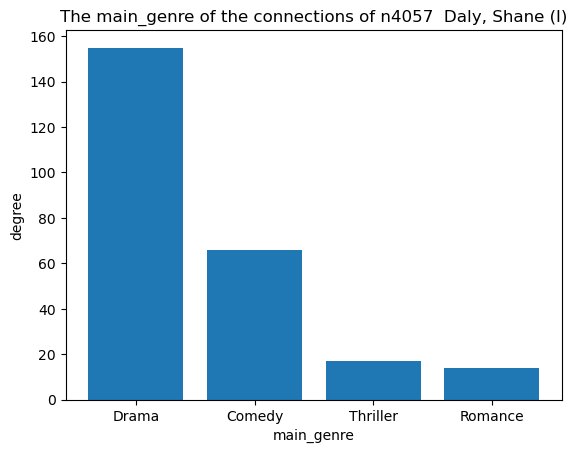

In [80]:
#bar plot for the main_genre of the connections of n4057
plt.bar(g1.vs[g1.neighbors('n4057', mode=ALL)]['main_genre'], g1.degree(g1.neighbors('n4057', mode=ALL)))
plt.xlabel("main_genre")
plt.ylabel("degree")
plt.title("The main_genre of the connections of n4057  Daly, Shane (I)")
plt.show() 

In [81]:
df_nodes.columns

Index(['id', 'ActorName', 'movies_95_04', 'main_genre', 'Music', 'Comedy',
       'Action', 'Adult', 'Western', 'Horror', 'Adventure', 'Fantasy',
       'Mystery', 'Crime', 'War', 'Sci-Fi', 'Short', 'Musical', 'Animation',
       'Romance', 'Drama', 'Thriller', 'Documentary', 'Family', 'degree',
       'degree_weighted_g1', 'max_triangles'],
      dtype='object')

<AxesSubplot: title={'center': 'Main Genre'}>

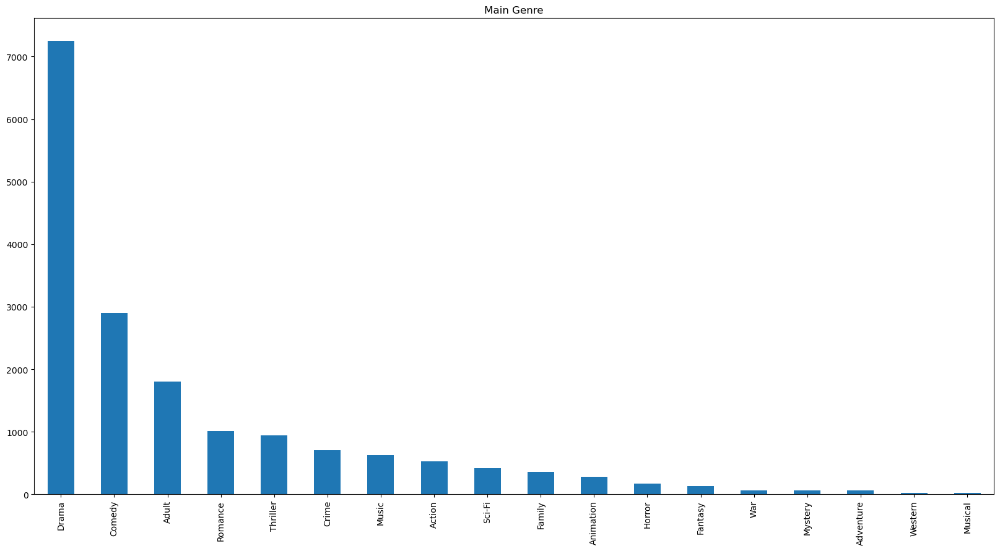

In [82]:
#bar plot of the main genre in df_nodes for g0
df_nodes_g0['main_genre'].value_counts().plot(kind='bar', title='Main Genre', figsize=(20,10))

- In this bar plot, we can see the type of movies the g0 network actors are more likely to do

In [83]:
#store in a variable neighbors the list of neighbors of all nodes in g1
neighbors = g1.neighborhood()

- We will add to our df the list of all neighbours in a separate column

In [84]:
#add neighbors to df_nodes
df_nodes['neighbors'] = neighbors

#head of df_nodes
df_nodes.head()

,id,ActorName,movies_95_04,main_genre,Music,Comedy,Action,Adult,Western,Horror,...,Animation,Romance,Drama,Thriller,Documentary,Family,degree,degree_weighted_g1,max_triangles,neighbors
0,n15629,"Rudder, Michael (I)",12,Thriller,0,1,1,0,0,1,...,0,1,1,2,0,0,36,113.0,0.523810,"[0, 431, 672, 717, 823, 858, 911, 1787, 3674, ..."
1,n5026,"Morgan, Debbi",16,Drama,0,2,0,0,0,2,...,0,2,6,0,1,0,23,47.0,0.462451,"[1, 352, 452, 1638, 2110, 2170, 3419, 4879, 52..."
2,n11252,"Bellows, Gil",33,Drama,0,6,0,0,0,1,...,0,6,7,4,1,1,22,48.0,0.212121,"[2, 3188, 4430, 4452, 4671, 5324, 5379, 5902, ..."
3,n5150,"Dray, Albert",20,Comedy,0,6,0,0,0,0,...,0,1,4,1,1,0,23,57.0,0.217391,"[3, 1441, 1499, 1867, 2597, 4154, 4834, 7306, ..."
4,n4057,"Daly, Shane (I)",18,Drama,1,2,0,0,0,1,...,0,1,7,4,0,0,46,108.0,0.147826,"[4, 11, 167, 2151, 2379, 2418, 2536, 2762, 289..."


**Obtain three vectors with the degree, betweeness and closeness for each vertex of the actors' graph.**

- We already have the degree, we will now append betweeenness and closeness
- For calculating this centrality measures we will consider the weight because it can affect the lenght of the path. 
- The edges with the highest weight will contribute more to the closeness between two nodes, while edges with a lower weight will have a less significant impact on the closeness between the two nodes.

For g1

In [85]:
#add to df_node betweenness centrality
betweenness = g1.betweenness(weights="weight", directed=False, cutoff=None)

df_nodes['betweenness'] = betweenness

#head of df_nodes
df_nodes.head()




,id,ActorName,movies_95_04,main_genre,Music,Comedy,Action,Adult,Western,Horror,...,Romance,Drama,Thriller,Documentary,Family,degree,degree_weighted_g1,max_triangles,neighbors,betweenness
0,n15629,"Rudder, Michael (I)",12,Thriller,0,1,1,0,0,1,...,1,1,2,0,0,36,113.0,0.523810,"[0, 431, 672, 717, 823, 858, 911, 1787, 3674, ...",3929.012117
1,n5026,"Morgan, Debbi",16,Drama,0,2,0,0,0,2,...,2,6,0,1,0,23,47.0,0.462451,"[1, 352, 452, 1638, 2110, 2170, 3419, 4879, 52...",21716.283252
2,n11252,"Bellows, Gil",33,Drama,0,6,0,0,0,1,...,6,7,4,1,1,22,48.0,0.212121,"[2, 3188, 4430, 4452, 4671, 5324, 5379, 5902, ...",13283.000044
3,n5150,"Dray, Albert",20,Comedy,0,6,0,0,0,0,...,1,4,1,1,0,23,57.0,0.217391,"[3, 1441, 1499, 1867, 2597, 4154, 4834, 7306, ...",111250.619299
4,n4057,"Daly, Shane (I)",18,Drama,1,2,0,0,0,1,...,1,7,4,0,0,46,108.0,0.147826,"[4, 11, 167, 2151, 2379, 2418, 2536, 2762, 289...",39968.780093


For g0

In [86]:
#add to df_node betweenness centrality
betweenness = g0.betweenness(weights="weight", directed=False, cutoff=None)

df_nodes_g0['betweenness'] = betweenness

#head of df_nodes
df_nodes_g0.head()



,name,degree_weighted_g0,degree_g0,ActorName,movies_95_04,main_genre,Short,Action,Crime,Mystery,...,Western,Adult,Romance,Adventure,War,Drama,Musical,Music,max_triangles,betweenness
0,n15629,113.0,36,"Rudder, Michael (I)",12,Thriller,0,1,0,0,...,0,0,1,0,1,1,0,0,0.523810,3929.012117
1,n5026,47.0,23,"Morgan, Debbi",16,Drama,0,0,0,0,...,0,0,2,0,0,6,0,0,0.462451,21716.283252
2,n11252,48.0,22,"Bellows, Gil",33,Drama,2,0,0,2,...,0,0,6,0,0,7,0,0,0.212121,13283.000044
3,n5150,57.0,23,"Dray, Albert",20,Comedy,1,0,1,0,...,0,0,1,0,0,4,0,0,0.217391,111250.619299
4,n4057,108.0,46,"Daly, Shane (I)",18,Drama,0,0,1,0,...,0,0,1,0,0,7,1,1,0.147826,39968.780093


- When calculating closeness centrality, if graph is not connected it may not work
    - iGraph compensates for this 
        - For added precision, we will calculate this for our connected graph g0
    - NetworkX must be calculated separately for different subgraphs

For g1

In [87]:
#add to df_node closeness
closeness = g1.closeness(weights="weight", mode=ALL, normalized=True)

df_nodes['closeness'] = closeness

#head of df_nodes
df_nodes.head()

,id,ActorName,movies_95_04,main_genre,Music,Comedy,Action,Adult,Western,Horror,...,Drama,Thriller,Documentary,Family,degree,degree_weighted_g1,max_triangles,neighbors,betweenness,closeness
0,n15629,"Rudder, Michael (I)",12,Thriller,0,1,1,0,0,1,...,1,2,0,0,36,113.0,0.523810,"[0, 431, 672, 717, 823, 858, 911, 1787, 3674, ...",3929.012117,0.110066
1,n5026,"Morgan, Debbi",16,Drama,0,2,0,0,0,2,...,6,0,1,0,23,47.0,0.462451,"[1, 352, 452, 1638, 2110, 2170, 3419, 4879, 52...",21716.283252,0.122167
2,n11252,"Bellows, Gil",33,Drama,0,6,0,0,0,1,...,7,4,1,1,22,48.0,0.212121,"[2, 3188, 4430, 4452, 4671, 5324, 5379, 5902, ...",13283.000044,0.112943
3,n5150,"Dray, Albert",20,Comedy,0,6,0,0,0,0,...,4,1,1,0,23,57.0,0.217391,"[3, 1441, 1499, 1867, 2597, 4154, 4834, 7306, ...",111250.619299,0.113965
4,n4057,"Daly, Shane (I)",18,Drama,1,2,0,0,0,1,...,7,4,0,0,46,108.0,0.147826,"[4, 11, 167, 2151, 2379, 2418, 2536, 2762, 289...",39968.780093,0.116535


For g0

In [88]:
#add to df_node closeness
closeness = g0.closeness(weights="weight", mode=ALL, normalized=True)

df_nodes_g0['closeness'] = closeness

#head of df_nodes
df_nodes_g0.head()

,name,degree_weighted_g0,degree_g0,ActorName,movies_95_04,main_genre,Short,Action,Crime,Mystery,...,Adult,Romance,Adventure,War,Drama,Musical,Music,max_triangles,betweenness,closeness
0,n15629,113.0,36,"Rudder, Michael (I)",12,Thriller,0,1,0,0,...,0,1,0,1,1,0,0,0.523810,3929.012117,0.110066
1,n5026,47.0,23,"Morgan, Debbi",16,Drama,0,0,0,0,...,0,2,0,0,6,0,0,0.462451,21716.283252,0.122167
2,n11252,48.0,22,"Bellows, Gil",33,Drama,2,0,0,2,...,0,6,0,0,7,0,0,0.212121,13283.000044,0.112943
3,n5150,57.0,23,"Dray, Albert",20,Comedy,1,0,1,0,...,0,1,0,0,4,0,0,0.217391,111250.619299,0.113965
4,n4057,108.0,46,"Daly, Shane (I)",18,Drama,0,0,1,0,...,0,1,0,0,7,1,1,0.147826,39968.780093,0.116535


- Besides this, we will also add Pagerank and 
    - PageRank is an algorithm used in graph theory to measure the relative importance of nodes within a graph. It assigns a score to each node based on the number of edges that are connected to it, and the importance of those edges. The higher the score, the more important the node is within the graph. PageRank is used to identify the most influential nodes within a network, which can help to identify key players and important relationships.
    - Eigenvector centrality is a measure of the importance of a node (or vertex) in a graph. It assigns relative scores to all nodes in the network based on the principle that connections to high-scoring nodes contribute more to the score of the node in question than connections to low-scoring nodes. This makes it a measure of "influence" in the network.

For g1

In [89]:
#add to df_node pagerank
pagerank = g1.pagerank(weights="weight", directed=False, damping=0.85, implementation="prpack")

df_nodes ['pagerank'] = pagerank

#head of df_nodes
df_nodes.head()

,id,ActorName,movies_95_04,main_genre,Music,Comedy,Action,Adult,Western,Horror,...,Thriller,Documentary,Family,degree,degree_weighted_g1,max_triangles,neighbors,betweenness,closeness,pagerank
0,n15629,"Rudder, Michael (I)",12,Thriller,0,1,1,0,0,1,...,2,0,0,36,113.0,0.523810,"[0, 431, 672, 717, 823, 858, 911, 1787, 3674, ...",3929.012117,0.110066,0.000072
1,n5026,"Morgan, Debbi",16,Drama,0,2,0,0,0,2,...,0,1,0,23,47.0,0.462451,"[1, 352, 452, 1638, 2110, 2170, 3419, 4879, 52...",21716.283252,0.122167,0.000042
2,n11252,"Bellows, Gil",33,Drama,0,6,0,0,0,1,...,4,1,1,22,48.0,0.212121,"[2, 3188, 4430, 4452, 4671, 5324, 5379, 5902, ...",13283.000044,0.112943,0.000051
3,n5150,"Dray, Albert",20,Comedy,0,6,0,0,0,0,...,1,1,0,23,57.0,0.217391,"[3, 1441, 1499, 1867, 2597, 4154, 4834, 7306, ...",111250.619299,0.113965,0.000066
4,n4057,"Daly, Shane (I)",18,Drama,1,2,0,0,0,1,...,4,0,0,46,108.0,0.147826,"[4, 11, 167, 2151, 2379, 2418, 2536, 2762, 289...",39968.780093,0.116535,0.000092


For g0

In [90]:
#add to df_node pagerank
pagerank = g0.pagerank(weights="weight", directed=False, damping=0.85, implementation="prpack")

df_nodes_g0 ['pagerank'] = pagerank

#head of df_nodes
df_nodes_g0.head()

,name,degree_weighted_g0,degree_g0,ActorName,movies_95_04,main_genre,Short,Action,Crime,Mystery,...,Romance,Adventure,War,Drama,Musical,Music,max_triangles,betweenness,closeness,pagerank
0,n15629,113.0,36,"Rudder, Michael (I)",12,Thriller,0,1,0,0,...,1,0,1,1,0,0,0.523810,3929.012117,0.110066,0.000073
1,n5026,47.0,23,"Morgan, Debbi",16,Drama,0,0,0,0,...,2,0,0,6,0,0,0.462451,21716.283252,0.122167,0.000043
2,n11252,48.0,22,"Bellows, Gil",33,Drama,2,0,0,2,...,6,0,0,7,0,0,0.212121,13283.000044,0.112943,0.000051
3,n5150,57.0,23,"Dray, Albert",20,Comedy,1,0,1,0,...,1,0,0,4,0,0,0.217391,111250.619299,0.113965,0.000066
4,n4057,108.0,46,"Daly, Shane (I)",18,Drama,0,0,1,0,...,1,0,0,7,1,1,0.147826,39968.780093,0.116535,0.000093


For g1

In [91]:
#add to df_node eigenvector centrality
eigenvector = g1.evcent(directed=False, weights="weight", scale=True, return_eigenvalue=False)

df_nodes['eigenvector'] = eigenvector

#head of df_nodes
df_nodes.head()

,id,ActorName,movies_95_04,main_genre,Music,Comedy,Action,Adult,Western,Horror,...,Documentary,Family,degree,degree_weighted_g1,max_triangles,neighbors,betweenness,closeness,pagerank,eigenvector
0,n15629,"Rudder, Michael (I)",12,Thriller,0,1,1,0,0,1,...,0,0,36,113.0,0.523810,"[0, 431, 672, 717, 823, 858, 911, 1787, 3674, ...",3929.012117,0.110066,0.000072,6.297170e-07
1,n5026,"Morgan, Debbi",16,Drama,0,2,0,0,0,2,...,1,0,23,47.0,0.462451,"[1, 352, 452, 1638, 2110, 2170, 3419, 4879, 52...",21716.283252,0.122167,0.000042,3.105026e-06
2,n11252,"Bellows, Gil",33,Drama,0,6,0,0,0,1,...,1,1,22,48.0,0.212121,"[2, 3188, 4430, 4452, 4671, 5324, 5379, 5902, ...",13283.000044,0.112943,0.000051,3.572485e-07
3,n5150,"Dray, Albert",20,Comedy,0,6,0,0,0,0,...,1,0,23,57.0,0.217391,"[3, 1441, 1499, 1867, 2597, 4154, 4834, 7306, ...",111250.619299,0.113965,0.000066,7.765481e-08
4,n4057,"Daly, Shane (I)",18,Drama,1,2,0,0,0,1,...,0,0,46,108.0,0.147826,"[4, 11, 167, 2151, 2379, 2418, 2536, 2762, 289...",39968.780093,0.116535,0.000092,2.372467e-08


For g0

In [92]:
#add to df_node eigenvector centrality
eigenvector = g0.evcent(directed=False, weights="weight", scale=True, return_eigenvalue=False)

df_nodes_g0['eigenvector'] = eigenvector

#head of df_nodes
df_nodes_g0.head()

,name,degree_weighted_g0,degree_g0,ActorName,movies_95_04,main_genre,Short,Action,Crime,Mystery,...,Adventure,War,Drama,Musical,Music,max_triangles,betweenness,closeness,pagerank,eigenvector
0,n15629,113.0,36,"Rudder, Michael (I)",12,Thriller,0,1,0,0,...,0,1,1,0,0,0.523810,3929.012117,0.110066,0.000073,6.297170e-07
1,n5026,47.0,23,"Morgan, Debbi",16,Drama,0,0,0,0,...,0,0,6,0,0,0.462451,21716.283252,0.122167,0.000043,3.105026e-06
2,n11252,48.0,22,"Bellows, Gil",33,Drama,2,0,0,2,...,0,0,7,0,0,0.212121,13283.000044,0.112943,0.000051,3.572485e-07
3,n5150,57.0,23,"Dray, Albert",20,Comedy,1,0,1,0,...,0,0,4,0,0,0.217391,111250.619299,0.113965,0.000066,7.765481e-08
4,n4057,108.0,46,"Daly, Shane (I)",18,Drama,0,0,1,0,...,0,0,7,1,1,0.147826,39968.780093,0.116535,0.000093,2.372467e-08


**Some queries for our new df in subgraph g0**

In [93]:
#show the top 20 nodes with the highest betweenness centrality
df_nodes_g0.sort_values(by=['betweenness'], ascending=False).head(20)


,name,degree_weighted_g0,degree_g0,ActorName,movies_95_04,main_genre,Short,Action,Crime,Mystery,...,Adventure,War,Drama,Musical,Music,max_triangles,betweenness,closeness,pagerank,eigenvector
10481,n2108,1805.0,471,"Sägebrecht, Marianne",20,Drama,1,0,1,0,...,0,0,7,0,0,0.133333,8.433928e+06,0.135451,0.000495,8.853594e-05
14337,n14458,21.0,8,"Stevenson, Cynthia",11,Drama,0,0,0,2,...,0,0,3,0,0,0.275000,4.302671e+06,0.092200,0.000045,1.711819e-09
15614,n17308,14.0,6,"Abad, Eileen",15,Romance,0,0,0,0,...,0,0,3,1,0,0.390476,4.267096e+06,0.078192,0.000027,2.115454e-12
4661,n3284,370.0,135,"Flores, Lolita",14,Comedy,0,0,0,0,...,0,0,2,1,2,0.572043,4.148216e+06,0.135479,0.000237,1.109866e-03
2545,n564,473.0,182,"Shimono, Sab",11,Thriller,1,0,0,0,...,0,1,2,0,0,NaN,3.730691e+06,0.141231,0.000279,7.543179e-05
17338,n285,403.0,159,"Federico, Luciano",21,Drama,2,1,1,0,...,0,0,6,0,0,0.238095,3.297737e+06,0.133139,0.000409,2.362821e-06
9786,n551,464.0,199,"Ninkovic, Natasa (I)",11,Drama,0,1,0,0,...,0,2,6,0,0,0.666667,2.717568e+06,0.139460,0.000199,3.113427e-02
8741,n13723,188.0,66,"Dunn-Hill, John",24,Thriller,0,2,1,2,...,1,1,4,0,0,0.314945,2.512696e+06,0.107528,0.000110,1.371894e-06
5482,n5083,311.0,121,"Makovetsky, Sergei",19,Drama,0,0,3,0,...,0,0,5,0,1,0.272727,2.367794e+06,0.119767,0.000364,1.356045e-08
1520,n5295,134.0,64,"Moore, Angela (I)",14,Drama,0,0,1,0,...,0,0,5,0,0,0.323529,2.331680e+06,0.136004,0.000127,3.093971e-07


In [94]:
#show the top 10 nodes with the highest closeness centrality
df_nodes_g0.sort_values(by=['closeness'], ascending=False).head(20)

,name,degree_weighted_g0,degree_g0,ActorName,movies_95_04,main_genre,Short,Action,Crime,Mystery,...,Adventure,War,Drama,Musical,Music,max_triangles,betweenness,closeness,pagerank,eigenvector
3561,n503,1006.0,361,"Morice, Tara",10,Drama,0,0,0,1,...,0,0,5,0,0,0.095238,1.318314e+06,0.144792,0.000546,0.000221
9593,n3213,1122.0,398,"Wepper, Elmar",31,Crime,1,0,12,0,...,0,0,4,0,0,0.268421,1.308539e+06,0.144257,0.000653,0.000083
8063,n3268,1135.0,376,"Akayama, Dennis",22,Thriller,1,1,0,0,...,1,0,2,0,0,0.193846,1.198498e+06,0.144198,0.000613,0.000234
4492,n701,1416.0,457,"Morshower, Glenn",25,Drama,1,2,0,3,...,0,1,5,0,0,0.085714,1.648365e+06,0.143909,0.000775,0.000178
10346,n1529,1271.0,427,"Lamar, Shay",11,NaN,0,0,0,0,...,0,0,0,0,0,0.373626,1.958456e+06,0.143695,0.000729,0.000177
5869,n3308,723.0,263,"MacLachlan, Kyle",20,Drama,0,1,0,0,...,0,0,4,0,0,0.147059,9.764389e+05,0.143135,0.000384,0.000081
14145,n756,677.0,257,"Nagy, Mari",15,Drama,0,0,0,0,...,0,0,6,0,0,0.463235,1.087885e+06,0.142972,0.000379,0.001127
4484,n3169,326.0,137,"Nercessian, Stepan",13,Romance,0,0,0,0,...,0,1,1,0,0,0.394280,8.878988e+05,0.142501,0.000216,0.000055
16149,n3260,682.0,253,"Pownall, Leon",10,Drama,0,0,0,0,...,0,0,7,0,0,0.307692,5.918033e+05,0.142406,0.000377,0.000162
16640,n2896,576.0,231,"Mack, Gene",13,Drama,1,1,1,1,...,0,0,6,0,0,0.228571,8.703512e+05,0.142269,0.000364,0.001141


- A betweenness score of 0 indicates that a node or edge in the network does not form a bridge between two other nodes or edges. A betweenness score of 0 means that the node or edge is not included in any of the shortest paths between two other nodes or edges in the network.
- A closeness score of 0.5 in igraph indicates that the node is relatively well-connected to other nodes in the graph. The score is a measure of the average distance between the node and the other nodes in the network. A score of 0.5 indicates that the node is close to the average distance of the other nodes.

In [95]:
#show the top 10 nodes with the highest closeness centrality and betweenness centrality different from 0
df_nodes_g0[(df_nodes_g0['betweenness'] != 0)].sort_values(by=['closeness'], ascending=False).head(10)



,name,degree_weighted_g0,degree_g0,ActorName,movies_95_04,main_genre,Short,Action,Crime,Mystery,...,Adventure,War,Drama,Musical,Music,max_triangles,betweenness,closeness,pagerank,eigenvector
3561,n503,1006.0,361,"Morice, Tara",10,Drama,0,0,0,1,...,0,0,5,0,0,0.095238,1.318314e+06,0.144792,0.000546,0.000221
9593,n3213,1122.0,398,"Wepper, Elmar",31,Crime,1,0,12,0,...,0,0,4,0,0,0.268421,1.308539e+06,0.144257,0.000653,0.000083
8063,n3268,1135.0,376,"Akayama, Dennis",22,Thriller,1,1,0,0,...,1,0,2,0,0,0.193846,1.198498e+06,0.144198,0.000613,0.000234
4492,n701,1416.0,457,"Morshower, Glenn",25,Drama,1,2,0,3,...,0,1,5,0,0,0.085714,1.648365e+06,0.143909,0.000775,0.000178
10346,n1529,1271.0,427,"Lamar, Shay",11,NaN,0,0,0,0,...,0,0,0,0,0,0.373626,1.958456e+06,0.143695,0.000729,0.000177
5869,n3308,723.0,263,"MacLachlan, Kyle",20,Drama,0,1,0,0,...,0,0,4,0,0,0.147059,9.764389e+05,0.143135,0.000384,0.000081
14145,n756,677.0,257,"Nagy, Mari",15,Drama,0,0,0,0,...,0,0,6,0,0,0.463235,1.087885e+06,0.142972,0.000379,0.001127
4484,n3169,326.0,137,"Nercessian, Stepan",13,Romance,0,0,0,0,...,0,1,1,0,0,0.394280,8.878988e+05,0.142501,0.000216,0.000055
16149,n3260,682.0,253,"Pownall, Leon",10,Drama,0,0,0,0,...,0,0,7,0,0,0.307692,5.918033e+05,0.142406,0.000377,0.000162
16640,n2896,576.0,231,"Mack, Gene",13,Drama,1,1,1,1,...,0,0,6,0,0,0.228571,8.703512e+05,0.142269,0.000364,0.001141


In [96]:
#show the top 10 nodes with the highest pagerank
df_nodes_g0.sort_values(by=['pagerank'], ascending=False).head(10)


,name,degree_weighted_g0,degree_g0,ActorName,movies_95_04,main_genre,Short,Action,Crime,Mystery,...,Adventure,War,Drama,Musical,Music,max_triangles,betweenness,closeness,pagerank,eigenvector
12069,n162,5435.0,784,"Christie, Julie (I)",15,Drama,0,0,0,0,...,2,0,3,0,0,0.509756,1.847603e+05,0.104901,0.000956,0.000117
4492,n701,1416.0,457,"Morshower, Glenn",25,Drama,1,2,0,3,...,0,1,5,0,0,0.085714,1.648365e+06,0.143909,0.000775,0.000178
13350,n1754,4065.0,599,"Fox, Vivica A.",51,Music,2,1,3,1,...,2,0,4,0,7,0.162393,2.550590e+05,0.107364,0.000735,0.000068
10346,n1529,1271.0,427,"Lamar, Shay",11,NaN,0,0,0,0,...,0,0,0,0,0,0.373626,1.958456e+06,0.143695,0.000729,0.000177
1750,n1743,3838.0,610,"Sachse, Dagmar",10,Crime,1,0,4,0,...,0,0,1,0,0,0.166667,3.246764e+05,0.110523,0.000667,0.000111
9593,n3213,1122.0,398,"Wepper, Elmar",31,Crime,1,0,12,0,...,0,0,4,0,0,0.268421,1.308539e+06,0.144257,0.000653,0.000083
3515,n2674,1311.0,410,"Stevenson, Ray",14,Drama,0,0,3,0,...,0,1,6,0,0,0.035714,5.495851e+05,0.141167,0.000645,0.001234
5930,n179,3380.0,545,"Buijsman, John",12,Comedy,2,0,1,0,...,0,0,0,0,0,0.000000,6.476971e+04,0.103916,0.000628,0.000037
11199,n1802,3433.0,584,"Lange, Artie",22,Comedy,1,0,1,0,...,0,0,1,0,0,0.241758,1.324800e+06,0.118974,0.000627,0.000059
2221,n176,3534.0,533,"Marull, Laia",17,Drama,1,1,0,0,...,0,0,4,0,0,0.424390,3.350505e+05,0.105640,0.000618,0.000072


- From the top 10 pagerank we can recognize some famous names from Hollywood indicating the relative importance of the actors with respect to the relative importance of their connections

**Obtain the list of the 20 actors with the largest degree centrality. It can be useful to show a list with the degree, the name of the actor, the number of movies, the main genre, and the number of genres in which the actor has participated.**





In [97]:
#list with 20 vertex ids with the largest degree centrality in g0
print("The 20 vertex ids with the largest degree centrality in the main graph are", sorted(range(len(g0.degree())), key=lambda i: g0.degree()[i], reverse=True)[:20])

The 20 vertex ids with the largest degree centrality in the main graph are [12069, 1750, 13350, 11199, 4060, 8296, 5930, 2221, 5715, 15405, 16315, 16947, 8785, 10481, 6793, 4492, 6545, 1115, 534, 11314]


In [98]:
#show the ActorName of the 20 vertex ids with the largest degree centrality in g0
for i in range(20):
    print("The Actor with the largest degree centrality coming ", i, " in the main graph is", g0.vs[sorted(range(len(g0.degree())), key=lambda i: g0.degree()[i], reverse=True)[i]]['ActorName'])
     

The Actor with the largest degree centrality coming  0  in the main graph is Davis, Mark (V)
The Actor with the largest degree centrality coming  1  in the main graph is Sanders, Alex (I)
The Actor with the largest degree centrality coming  2  in the main graph is North, Peter (I)
The Actor with the largest degree centrality coming  3  in the main graph is Marcus, Mr.
The Actor with the largest degree centrality coming  4  in the main graph is Tedeschi, Tony
The Actor with the largest degree centrality coming  5  in the main graph is Dough, Jon
The Actor with the largest degree centrality coming  6  in the main graph is Stone, Lee (II)
The Actor with the largest degree centrality coming  7  in the main graph is Voyeur, Vince
The Actor with the largest degree centrality coming  8  in the main graph is Lawrence, Joel (II)
The Actor with the largest degree centrality coming  9  in the main graph is Steele, Lexington
The Actor with the largest degree centrality coming  10  in the main grap

In [100]:
#show the top 20 nodes with highest degree centrality in g0
df_nodes_g0.sort_values(by=['degree_weighted_g0'], ascending=False).head(20)


,name,degree_weighted_g0,degree_g0,ActorName,movies_95_04,main_genre,Short,Action,Crime,Mystery,...,Adventure,War,Drama,Musical,Music,max_triangles,betweenness,closeness,pagerank,eigenvector
12069,n162,5435.0,784,"Christie, Julie (I)",15,Drama,0,0,0,0,...,2,0,3,0,0,0.509756,1.847603e+05,0.104901,0.000956,0.000117
13350,n1754,4065.0,599,"Fox, Vivica A.",51,Music,2,1,3,1,...,2,0,4,0,7,0.162393,2.550590e+05,0.107364,0.000735,0.000068
1750,n1743,3838.0,610,"Sachse, Dagmar",10,Crime,1,0,4,0,...,0,0,1,0,0,0.166667,3.246764e+05,0.110523,0.000667,0.000111
2221,n176,3534.0,533,"Marull, Laia",17,Drama,1,1,0,0,...,0,0,4,0,0,0.424390,3.350505e+05,0.105640,0.000618,0.000072
11199,n1802,3433.0,584,"Lange, Artie",22,Comedy,1,0,1,0,...,0,0,1,0,0,0.241758,1.324800e+06,0.118974,0.000627,0.000059
5930,n179,3380.0,545,"Buijsman, John",12,Comedy,2,0,1,0,...,0,0,0,0,0,0.000000,6.476971e+04,0.103916,0.000628,0.000037
4060,n407,3143.0,561,"Heart, Bonnie",13,Adult,0,0,0,0,...,0,0,0,0,0,0.597403,5.059528e+05,0.112314,0.000549,0.000049
9798,n5417,3062.0,206,"Hausgaard, Niels",10,Comedy,1,0,0,0,...,0,0,1,0,2,0.000000,7.258909e+01,0.099081,0.000153,1.000000
3593,n5389,3029.0,207,"Mattos, André",15,Drama,1,0,1,0,...,0,1,5,0,0,0.475421,1.535125e+02,0.099737,0.000152,0.983604
8296,n164,2960.0,555,"Faerber, Peter",12,Crime,0,1,5,0,...,0,0,1,0,0,0.350769,9.351259e+05,0.115694,0.000525,0.000077


**8) Who is the actor with highest degree centrality?**
- This  is determined by the highest number of connections (edges) to other nodes in a network.

In [101]:
#vertex id with highest degree centrality in g0
print("The vertex id with the highest degree centrality in the main graph is", g0.degree().index(max(g0.degree())))


The vertex id with the highest degree centrality in the main graph is 12069


In [102]:
#show ActorName of the vertex id with highest degree centrality in g0
print("The ActorName with the highest degree centrality in the main graph is", g0.vs[g0.degree().index(max(g0.degree()))]["ActorName"])

The ActorName with the highest degree centrality in the main graph is Davis, Mark (V)


In [103]:
#vertex id with highest degree centrality in subgraphs
for i in range(len(subgraphs_weak)):
    print("The vertex id with the highest degree centrality in subgraph", i, "is", subgraphs_weak.subgraph(i).degree().index(max(subgraphs_weak.subgraph(i).degree())))


The vertex id with the highest degree centrality in subgraph 0 is 12069
The vertex id with the highest degree centrality in subgraph 1 is 1
The vertex id with the highest degree centrality in subgraph 2 is 22
The vertex id with the highest degree centrality in subgraph 3 is 0
The vertex id with the highest degree centrality in subgraph 4 is 28
The vertex id with the highest degree centrality in subgraph 5 is 0
The vertex id with the highest degree centrality in subgraph 6 is 0
The vertex id with the highest degree centrality in subgraph 7 is 0
The vertex id with the highest degree centrality in subgraph 8 is 0
The vertex id with the highest degree centrality in subgraph 9 is 0
The vertex id with the highest degree centrality in subgraph 10 is 0
The vertex id with the highest degree centrality in subgraph 11 is 0
The vertex id with the highest degree centrality in subgraph 12 is 0
The vertex id with the highest degree centrality in subgraph 13 is 0
The vertex id with the highest degree 

In [104]:
# ActorName of the vertex id with highest degree centrality in subgraphs
for i in range(len(subgraphs_weak)):
    print("The ActorName with the highest degree centrality in subgraph", i, "is", subgraphs_weak.subgraph(i).vs[subgraphs_weak.subgraph(i).degree().index(max(subgraphs_weak.subgraph(i).degree()))]["ActorName"])

The ActorName with the highest degree centrality in subgraph 0 is Davis, Mark (V)
The ActorName with the highest degree centrality in subgraph 1 is Klauzner, Uri
The ActorName with the highest degree centrality in subgraph 2 is Lee, Beom-su
The ActorName with the highest degree centrality in subgraph 3 is Vischer, Lisa
The ActorName with the highest degree centrality in subgraph 4 is Kotanidis, Yorgos
The ActorName with the highest degree centrality in subgraph 5 is Shakibai, Khosro
The ActorName with the highest degree centrality in subgraph 6 is Nor, Rosyam
The ActorName with the highest degree centrality in subgraph 7 is Armanis, Julian
The ActorName with the highest degree centrality in subgraph 8 is Holt, David (III)
The ActorName with the highest degree centrality in subgraph 9 is Black, Rick (II)
The ActorName with the highest degree centrality in subgraph 10 is Fox, Emilia
The ActorName with the highest degree centrality in subgraph 11 is Matsushita, Yuki
The ActorName with the

**9) How do you explain the high degree of the top-20 list??**

- The highest degree centrality measurement is determined by the highest number of connections to other nodes in a network. 
- These are the most popular actors taking by "popular" the number of connections to other actors they have
- A high degree indicates that the actor has worked with many other actors in the past, and is therefore very well-connected in the acting industry. 
- In general, an actor with a high degree is likely to have more success in their career than one with a low degree.

**Obtain the list of the 20 actors with the largest betweenness centrality. Show a list with the betweenness, the name of the actor, the number of movies, the main genre, and the number of genres in which the actor has participated.**

In [105]:
#show top 20 nodes with highest betweenness centrality in df_nodes
df_nodes_g0.sort_values(by=['betweenness'], ascending=False).head(20)

,name,degree_weighted_g0,degree_g0,ActorName,movies_95_04,main_genre,Short,Action,Crime,Mystery,...,Adventure,War,Drama,Musical,Music,max_triangles,betweenness,closeness,pagerank,eigenvector
10481,n2108,1805.0,471,"Sägebrecht, Marianne",20,Drama,1,0,1,0,...,0,0,7,0,0,0.133333,8.433928e+06,0.135451,0.000495,8.853594e-05
14337,n14458,21.0,8,"Stevenson, Cynthia",11,Drama,0,0,0,2,...,0,0,3,0,0,0.275000,4.302671e+06,0.092200,0.000045,1.711819e-09
15614,n17308,14.0,6,"Abad, Eileen",15,Romance,0,0,0,0,...,0,0,3,1,0,0.390476,4.267096e+06,0.078192,0.000027,2.115454e-12
4661,n3284,370.0,135,"Flores, Lolita",14,Comedy,0,0,0,0,...,0,0,2,1,2,0.572043,4.148216e+06,0.135479,0.000237,1.109866e-03
2545,n564,473.0,182,"Shimono, Sab",11,Thriller,1,0,0,0,...,0,1,2,0,0,NaN,3.730691e+06,0.141231,0.000279,7.543179e-05
17338,n285,403.0,159,"Federico, Luciano",21,Drama,2,1,1,0,...,0,0,6,0,0,0.238095,3.297737e+06,0.133139,0.000409,2.362821e-06
9786,n551,464.0,199,"Ninkovic, Natasa (I)",11,Drama,0,1,0,0,...,0,2,6,0,0,0.666667,2.717568e+06,0.139460,0.000199,3.113427e-02
8741,n13723,188.0,66,"Dunn-Hill, John",24,Thriller,0,2,1,2,...,1,1,4,0,0,0.314945,2.512696e+06,0.107528,0.000110,1.371894e-06
5482,n5083,311.0,121,"Makovetsky, Sergei",19,Drama,0,0,3,0,...,0,0,5,0,1,0.272727,2.367794e+06,0.119767,0.000364,1.356045e-08
1520,n5295,134.0,64,"Moore, Angela (I)",14,Drama,0,0,1,0,...,0,0,5,0,0,0.323529,2.331680e+06,0.136004,0.000127,3.093971e-07


**10) Who is the actor with highest betweenes?**

In [106]:
df_nodes_g0.sort_values(by=['betweenness'], ascending=False).head(1)

,name,degree_weighted_g0,degree_g0,ActorName,movies_95_04,main_genre,Short,Action,Crime,Mystery,...,Adventure,War,Drama,Musical,Music,max_triangles,betweenness,closeness,pagerank,eigenvector
10481,n2108,1805.0,471,"Sägebrecht, Marianne",20,Drama,1,0,1,0,...,0,0,7,0,0,0.133333,8.433928e+06,0.135451,0.000495,0.000089


In [110]:
#show g1 subgraph for id n2108 showing the connections to other nodes
g2108 = g0.subgraph(g0.neighborhood('n2108', order=1, mode=ALL))
 
#plot g2108 with ActorName as labels
plot(g2108, layout = g2108.layout("kk"), vertex_label = g2108.vs["ActorName"], bbox = (0, 0, 1000, 1000), margin = 50)
      


**11) How do you explain the high betweenness of the top-20 list?**

- This indicates that certain actors are the main connections between different actors in the graph and can be consequently explained by a number of factors:
    - Certain actors acting in many movies with different co-stars, or being part of a successful acting group that appears in multiple films.
    - Certain actors having longer acting careers and appearing in more films over time.
    - Higher fame and popularity than others over a period of time (i.e: Vin Diesel in the 2000s, The Rock today, etc)


**Obtain the list of the 20 actors with the largest closeness centrality. Show a list with the closeness the name of the actor, the number of movies, the main genre, and the number of genres in which the actor has participated.**

In [108]:
df_nodes_g0.sort_values(by=['closeness'], ascending=False).head(20)


,name,degree_weighted_g0,degree_g0,ActorName,movies_95_04,main_genre,Short,Action,Crime,Mystery,...,Adventure,War,Drama,Musical,Music,max_triangles,betweenness,closeness,pagerank,eigenvector
3561,n503,1006.0,361,"Morice, Tara",10,Drama,0,0,0,1,...,0,0,5,0,0,0.095238,1.318314e+06,0.144792,0.000546,0.000221
9593,n3213,1122.0,398,"Wepper, Elmar",31,Crime,1,0,12,0,...,0,0,4,0,0,0.268421,1.308539e+06,0.144257,0.000653,0.000083
8063,n3268,1135.0,376,"Akayama, Dennis",22,Thriller,1,1,0,0,...,1,0,2,0,0,0.193846,1.198498e+06,0.144198,0.000613,0.000234
4492,n701,1416.0,457,"Morshower, Glenn",25,Drama,1,2,0,3,...,0,1,5,0,0,0.085714,1.648365e+06,0.143909,0.000775,0.000178
10346,n1529,1271.0,427,"Lamar, Shay",11,NaN,0,0,0,0,...,0,0,0,0,0,0.373626,1.958456e+06,0.143695,0.000729,0.000177
5869,n3308,723.0,263,"MacLachlan, Kyle",20,Drama,0,1,0,0,...,0,0,4,0,0,0.147059,9.764389e+05,0.143135,0.000384,0.000081
14145,n756,677.0,257,"Nagy, Mari",15,Drama,0,0,0,0,...,0,0,6,0,0,0.463235,1.087885e+06,0.142972,0.000379,0.001127
4484,n3169,326.0,137,"Nercessian, Stepan",13,Romance,0,0,0,0,...,0,1,1,0,0,0.394280,8.878988e+05,0.142501,0.000216,0.000055
16149,n3260,682.0,253,"Pownall, Leon",10,Drama,0,0,0,0,...,0,0,7,0,0,0.307692,5.918033e+05,0.142406,0.000377,0.000162
16640,n2896,576.0,231,"Mack, Gene",13,Drama,1,1,1,1,...,0,0,6,0,0,0.228571,8.703512e+05,0.142269,0.000364,0.001141



**12) Who is the actor with highest closeness centrality?**



In [109]:
df_nodes_g0.sort_values(by=['closeness'], ascending=False).head(1)
 

,name,degree_weighted_g0,degree_g0,ActorName,movies_95_04,main_genre,Short,Action,Crime,Mystery,...,Adventure,War,Drama,Musical,Music,max_triangles,betweenness,closeness,pagerank,eigenvector
3561,n503,1006.0,361,"Morice, Tara",10,Drama,0,0,0,1,...,0,0,5,0,0,0.095238,1.318314e+06,0.144792,0.000546,0.000221


In [112]:
#show g1 subgraph for id n16631 showing the connections to other nodes
g503 = g0.subgraph(g0.neighborhood('n503', order=1, mode=ALL))

#plot g16631 with ActorName and main_genre as labels and edge showing the weight and main_genre
plot(g503, layout = g503.layout("kk"), vertex_label = g503.vs["ActorName"], edge_label = g503.es["weight"])


**13) How do you explain the high closeness of the top-20 list?**

- The high closeness in a graph can be explained as the degree of how close each actor is to all other actors in the graph.
- A high closeness indicates that the actor has a large number of edges connecting him/her to the other actors in the graph
- The actor/ actress might have had a number of roles in different films or TV shows with other actors in the graph. 
- The actor might have worked in films or TV shows with many different actors or genres
- The higher the degree of connectivity between the actor and the other actors in the graph, the higher the closeness score.

# <a id='toc9_'></a>[Export Section](#toc0_)

In [115]:
#export df_nodes to csv
df_nodes.to_csv("df_nodes_g1-imdb.csv")
df_nodes_g0.to_csv("df_nodes_g0-imdb.csv")